# Coronavirus (COVID-19) Visualization, Comparisons & Prediction 

<center><img src='https://dreambuildingtest.files.wordpress.com/2019/10/6cac4-background-machine-learning-franki-chamaki-z4h9mymwima-unsplash-2000-529.jpg' width="1000" height="200" >

## Introduction 
Coronavirus is a family of viruses that are named after their spiky crown. The novel coronavirus, also known as SARS-CoV-2, is a contagious respiratory virus that first reported in Wuhan, China. On 2/11/2020, the World Health Organization designated the name COVID-19 for the disease caused by the novel coronavirus. This notebook aims at exploring COVID-19 through data analysis and projections. 


#### This notebook aims at exploring COVID-19 situation all around the world and in Iran through data analysis and projections.




   Coronavirus Case Data is provided by <a href='https://github.com/CSSEGISandData/COVID-19'>Johns Hopkins University</a>
   <br>Mobility data is provided by <a href='https://www.apple.com/covid19/mobility'>Apple</a>
   <br>Learn more from the <a href='https://www.who.int/emergencies/diseases/novel-coronavirus-2019'>World Health Organization</a>
   <br>Learn more from the <a href='https://www.cdc.gov/coronavirus/2019-ncov'>Centers for Disease Control and Prevention</a>
   <br>Check out map visualizations from  <a href='https://gisanddata.maps.arcgis.com/apps/opsdashboard/index.html#/bda7594740fd40299423467b48e9ecf6'>JHU CCSE Dashboard</a>
   
   > Don't PANIC, Keep strong, world. We can get through this! follow WHO guidelines. Wear masks, wash your hands and stay safe and Healthy.</font>

## To Do List

<font face = "Verdana" size ="3"> Sections </font>
* <a href='#world_wide_graphs'>Exploring Global Coronavirus Cases</a>
* <a href='#country_graphs'>Exploring Coronavirus Cases From Different Countries</a>
* <a href='#prediction'>Worldwide Confirmed Cases Prediction</a>
* <a href='#data_table'>Data Table</a>
* <a href='#pie_charts'>Pie Charts</a>
* <a href='#bar_charts'>Bar Charts</a>
* <a href='#hospital_testing'>US Testing Data</a>
* <a href='#mobility_data'>Mobility Data for Hotspots</a>
* <a href='#prediction'>Perdict</a>
* <a href='#gviz'>Geographical visualization</a>


## Import Libraries

In [2]:
import pandas as pd 
import numpy as np 

import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors

import random
import math
import time
import datetime
import operator 

from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error

plt.style.use('fivethirtyeight')
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

#### Import the data

In [3]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/12-25-2020.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/12-25-2020.csv')
apple_mobility = pd.read_csv('https://covid19-static.cdn-apple.com/covid19-mobility-data/2023HotfixDev19/v3/en-us/applemobilitytrends-2020-12-25.csv')

In [3]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,45723,45844,46116,46274,46516,46718,46837,46837,47072,47306
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,36245,36790,37625,38182,39014,39719,40501,41302,42148,42988
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,80168,81212,82221,83199,84152,85084,85927,86730,87502,88252
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,6610,6610,6712,6745,6790,6842,6904,6955,7005,7050
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,15008,15087,15103,15139,15251,15319,15361,15493,15536,15591


In [4]:
deaths_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,1740,1752,1774,1795,1822,1841,1846,1846,1864,1874
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,771,787,798,810,822,839,852,870,889,905
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,2372,2393,2410,2431,2447,2464,2480,2492,2501,2516
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,76,76,76,76,76,76,77,77,78,78
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,342,345,346,348,350,351,352,353,354,354


In [5]:
recoveries_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,36295,36709,36716,36831,36946,37218,37260,37260,37393,37685
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,17755,18152,18481,18849,19384,19912,20484,20974,21286,21617
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,51946,52568,53204,53809,54405,54990,55538,56079,56617,57146
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,5710,5710,5794,5873,5940,5988,6066,6130,6171,6238
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,7697,7763,7763,7851,7932,8139,8244,8299,8335,8338


In [6]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2020-12-06 05:26:18,33.93911,67.709953,47072,1864,37393,7815.0,Afghanistan,120.919615,3.959891
1,NaN,NaN,NaN,Albania,2020-12-06 05:26:18,41.15330,20.168300,42148,889,21286,19973.0,Albania,1464.591007,2.109234
2,NaN,NaN,NaN,Algeria,2020-12-06 05:26:18,28.03390,1.659600,87502,2501,56617,28384.0,Algeria,199.543714,2.858220
3,NaN,NaN,NaN,Andorra,2020-12-06 05:26:18,42.50630,1.521800,7005,78,6171,756.0,Andorra,9066.200738,1.113490
4,NaN,NaN,NaN,Angola,2020-12-06 05:26:18,-11.20270,17.873900,15536,354,8335,6847.0,Angola,47.270350,2.278579


In [7]:
us_medical_data.head()

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-12-06 05:30:26,32.3182,-86.9023,267589,3877,168387.0,95325.0,1.0,5457.452656,1637161.0,NaN,1.448864,84000001.0,USA,33389.745645,NaN
1,Alaska,US,2020-12-06 05:30:26,61.3707,-152.4044,36271,143,7165.0,28963.0,2.0,4958.136547,1067231.0,NaN,0.394254,84000002.0,USA,145887.265992,NaN
2,American Samoa,US,2020-12-06 05:30:26,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,2140.0,NaN,NaN,16.0,ASM,3846.084722,NaN
3,Arizona,US,2020-12-06 05:30:26,33.7298,-111.4312,358900,6925,55640.0,296335.0,4.0,4930.814043,2349913.0,NaN,1.929507,84000004.0,USA,32284.714463,NaN
4,Arkansas,US,2020-12-06 05:30:26,34.9697,-92.3731,169382,2620,148131.0,18631.0,5.0,5612.756826,1748446.0,NaN,1.546800,84000005.0,USA,57937.692441,NaN


## Data Preprocessing and Exploring 

In [4]:
cols = confirmed_df.keys()

In [5]:
cols[:10]

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20'],
      dtype='object')

In [6]:
len(cols)

351

Get all the dates for the ongoing coronavirus pandemic

In [7]:
# Get the dates column 4 to end
confirmed = confirmed_df.loc[:, cols[4]:cols[-1]]
deaths = deaths_df.loc[:, cols[4]:cols[-1]]
recoveries = recoveries_df.loc[:, cols[4]:cols[-1]]

In [8]:
dates = confirmed.keys()

world_cases = []
total_deaths = [] 
total_recovered = [] 
total_active = [] 
mortality_rate = []
recovery_rate = [] 

for i in dates:
    confirmed_sum = confirmed[i].sum()                      # Sum of confiremd cases all over the world
    death_sum = deaths[i].sum()                             # Sum of death cases all over the world
    recovered_sum = recoveries[i].sum()                     # Sum of recovered cases all over the World
    
    # confirmed, deaths, recovered, and active
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    total_recovered.append(recovered_sum)
    total_active.append(confirmed_sum-death_sum-recovered_sum)
    
    # calculate rates
    mortality_rate.append(death_sum/confirmed_sum)
    recovery_rate.append(recovered_sum/confirmed_sum)

Getting daily increases and moving averages

In [9]:
def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 

def moving_average(data, window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average

# window size
window = 7

# confirmed cases
world_daily_increase = daily_increase(world_cases)
world_confirmed_avg= moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase, window)

# deaths
world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths, window)
world_daily_death_avg = moving_average(world_daily_death, window)


# recoveries
world_daily_recovery = daily_increase(total_recovered)
world_recovery_avg = moving_average(total_recovered, window)
world_daily_recovery_avg = moving_average(world_daily_recovery, window)


# active 
world_active_avg = moving_average(total_active, window)

In [10]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)
total_recovered = np.array(total_recovered).reshape(-1, 1)

Future forcasting

In [11]:
days_in_future = 10
future_forcast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-10]

Convert integer into datetime for better visualization

In [12]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

In [13]:
# slightly modify the data to fit the model better (regression models cannot pick the pattern)
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22[50:], world_cases[50:], test_size=0.05, shuffle=False) 

Model for predicting # of confirmed cases. I am using support vector machine, bayesian ridge , and linear regression in this example. We will show the results in the later section. 

In [18]:
# # use this to find the optimal parameters for SVR
# c = [0.01, 0.1, 1]
# gamma = [0.01, 0.1, 1]
# epsilon = [0.01, 0.1, 1]
# shrinking = [True, False]

# svm_grid = {'C': c, 'gamma' : gamma, 'epsilon': epsilon, 'shrinking' : shrinking}

# svm = SVR(kernel='poly', degree=3)
# svm_search = RandomizedSearchCV(svm, svm_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=30, verbose=1)
# svm_search.fit(X_train_confirmed, y_train_confirmed)

In [19]:
# svm_search.best_params_

In [14]:
# svm_confirmed = svm_search.best_estimator_
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
svm_pred = svm_confirmed.predict(future_forcast)

MAE: 455499.47872581583
MSE: 268545114437.45975


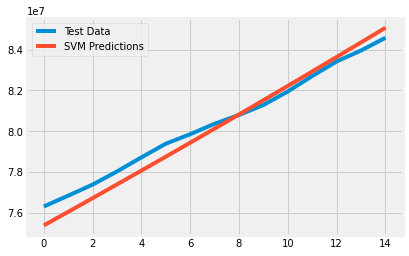

In [15]:
# check against testing data
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))

In [22]:
# # transform our data for polynomial regression
# poly = PolynomialFeatures(degree=4)
# poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
# poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
# poly_future_forcast = poly.fit_transform(future_forcast)

# bayesian_poly = PolynomialFeatures(degree=5)
# bayesian_poly_X_train_confirmed = bayesian_poly.fit_transform(X_train_confirmed)
# bayesian_poly_X_test_confirmed = bayesian_poly.fit_transform(X_test_confirmed)
# bayesian_poly_future_forcast = bayesian_poly.fit_transform(future_forcast)

In [23]:
# # polynomial regression
# linear_model = LinearRegression(normalize=True, fit_intercept=False)
# linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
# test_linear_pred = linear_model.predict(poly_X_test_confirmed)
# linear_pred = linear_model.predict(poly_future_forcast)
# print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
# print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed))

MAE: 1023134.991454895
MSE: 1051626940710.2299


In [24]:
# print(linear_model.coef_)

[[ 5.55908214e+06 -1.99224440e+05  2.37740946e+03 -7.81189244e+00
   1.31050159e-02]]


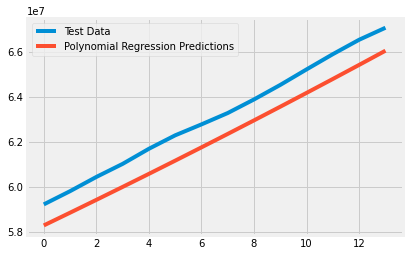

In [25]:
# plt.plot(y_test_confirmed)
# plt.plot(test_linear_pred)
# plt.legend(['Test Data', 'Polynomial Regression Predictions'])

In [26]:
# # bayesian ridge polynomial regression
# tol = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
# alpha_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
# alpha_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
# lambda_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
# lambda_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
# normalize = [True, False]

# bayesian_grid = {'tol': tol, 'alpha_1': alpha_1, 'alpha_2' : alpha_2, 'lambda_1': lambda_1, 'lambda_2' : lambda_2, 
#                  'normalize' : normalize}

# bayesian = BayesianRidge(fit_intercept=False)
# bayesian_search = RandomizedSearchCV(bayesian, bayesian_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=40, verbose=1)
# bayesian_search.fit(bayesian_poly_X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    4.0s finished


RandomizedSearchCV(cv=3, estimator=BayesianRidge(fit_intercept=False),
                   n_iter=40, n_jobs=-1,
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'alpha_2': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'lambda_1': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'lambda_2': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'normalize': [True, False],
                                        'tol': [1e-06, 1e-05, 0.0001, 0.001,
                                                0.01]},
                   return_train_score=True, scoring='neg_mean_squared_error',
                   verbose=1)

In [27]:
# bayesian_search.best_params_

{'tol': 0.0001,
 'normalize': True,
 'lambda_2': 1e-07,
 'lambda_1': 0.001,
 'alpha_2': 0.0001,
 'alpha_1': 1e-06}

In [28]:
# bayesian_confirmed = bayesian_search.best_estimator_
# test_bayesian_pred = bayesian_confirmed.predict(bayesian_poly_X_test_confirmed)
# bayesian_pred = bayesian_confirmed.predict(bayesian_poly_future_forcast)
# print('MAE:', mean_absolute_error(test_bayesian_pred, y_test_confirmed))
# print('MSE:',mean_squared_error(test_bayesian_pred, y_test_confirmed))

MAE: 1260371.6168861794
MSE: 1598310516035.0383


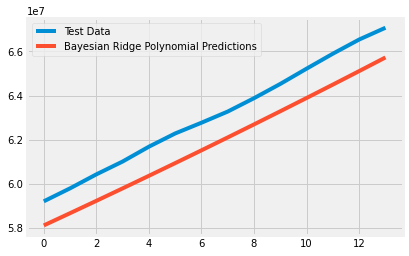

In [29]:
# plt.plot(y_test_confirmed)
# plt.plot(test_bayesian_pred)
# plt.legend(['Test Data', 'Bayesian Ridge Polynomial Predictions'])

# Worldwide Overview 
Graphing the number of confirmed cases, active cases, deaths, recoveries, mortality rate (CFR), and recovery rate worldwide. This gives us a big picture of the ongoing pandemic. 
 <a id='world_wide_graphs'></a>

In [30]:
# helper method for flattening the data, so it can be displayed on a bar graph 
def flatten(arr):
    a = [] 
    arr = arr.tolist()
    for i in arr:
        a.append(i[0])
    return a

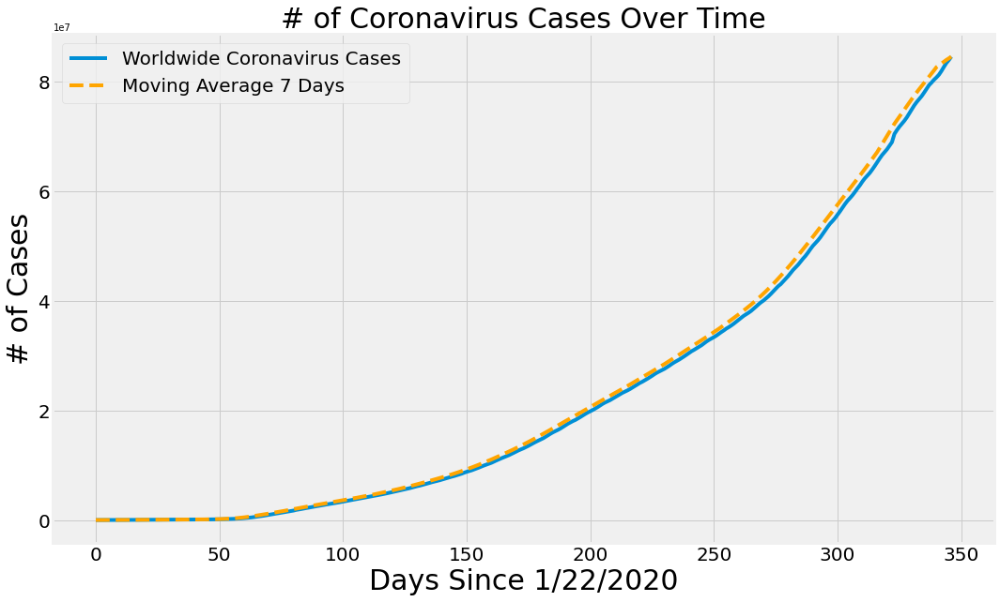

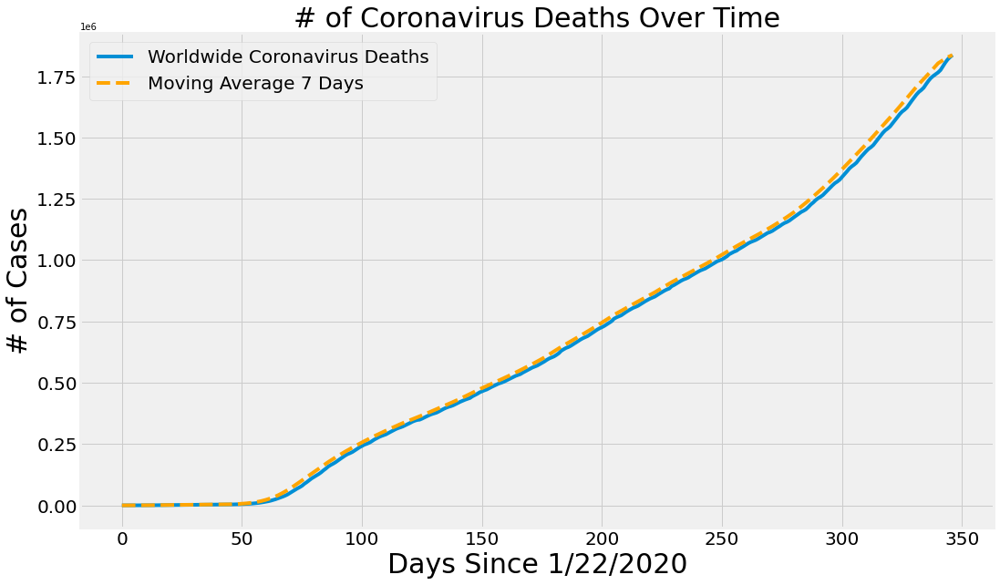

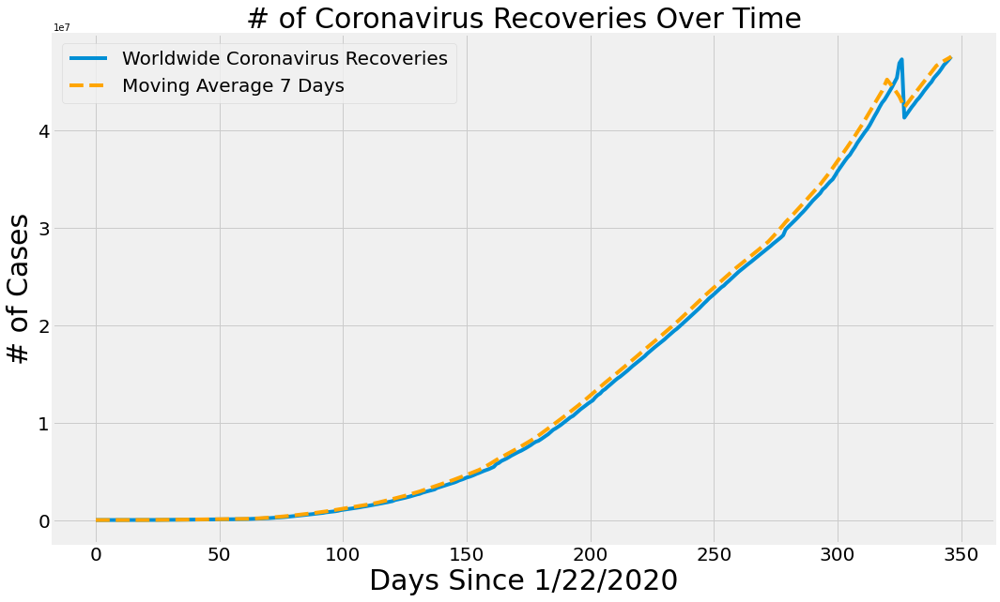

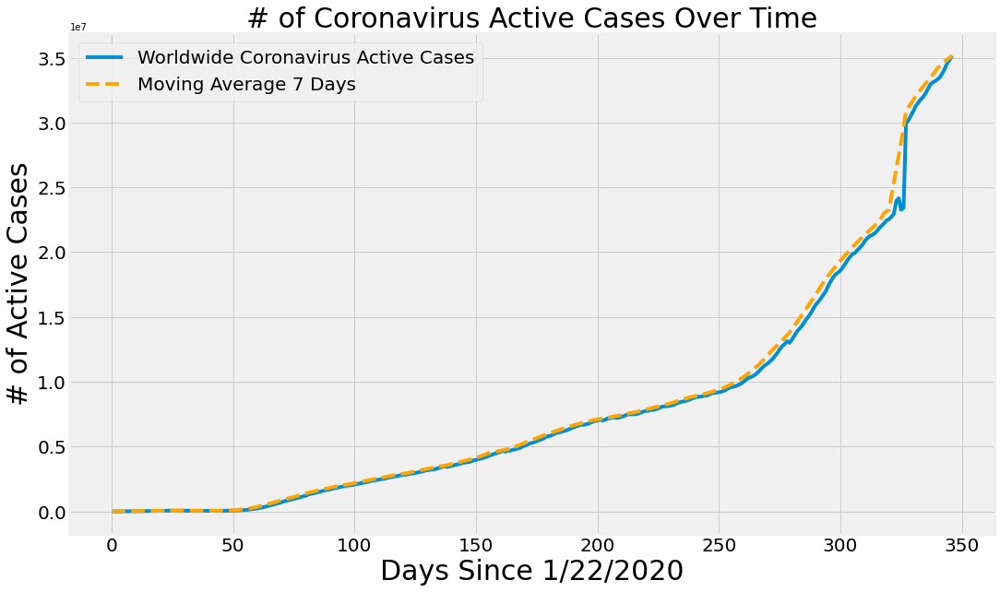

In [16]:
#  row is 1, column unknown
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Deaths', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_recovered)
plt.plot(adjusted_dates, world_recovery_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Recoveries Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Recoveries', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_active)
plt.plot(adjusted_dates, world_active_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Active Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Active Cases', size=30)
plt.legend(['Worldwide Coronavirus Active Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

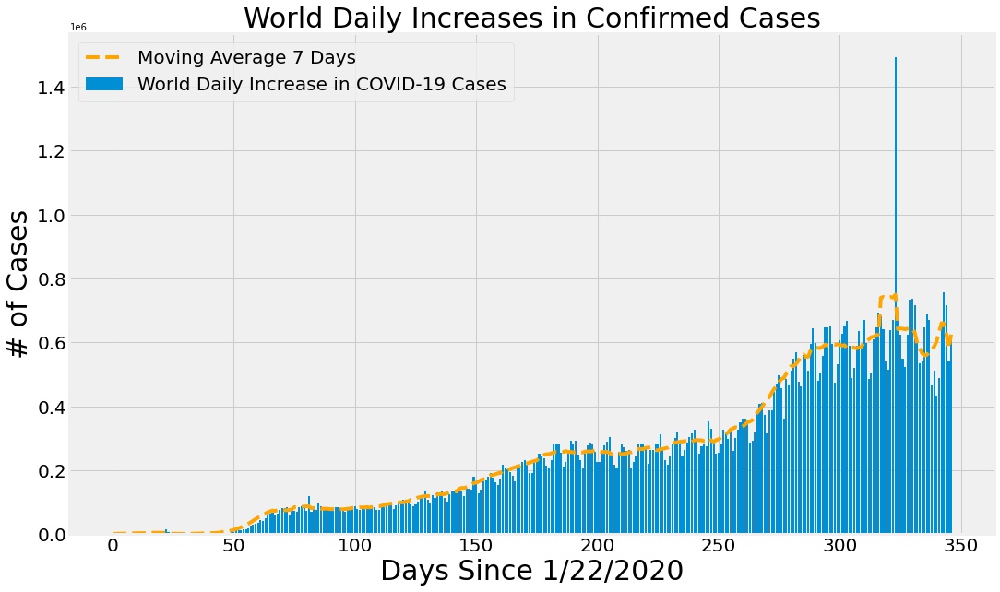

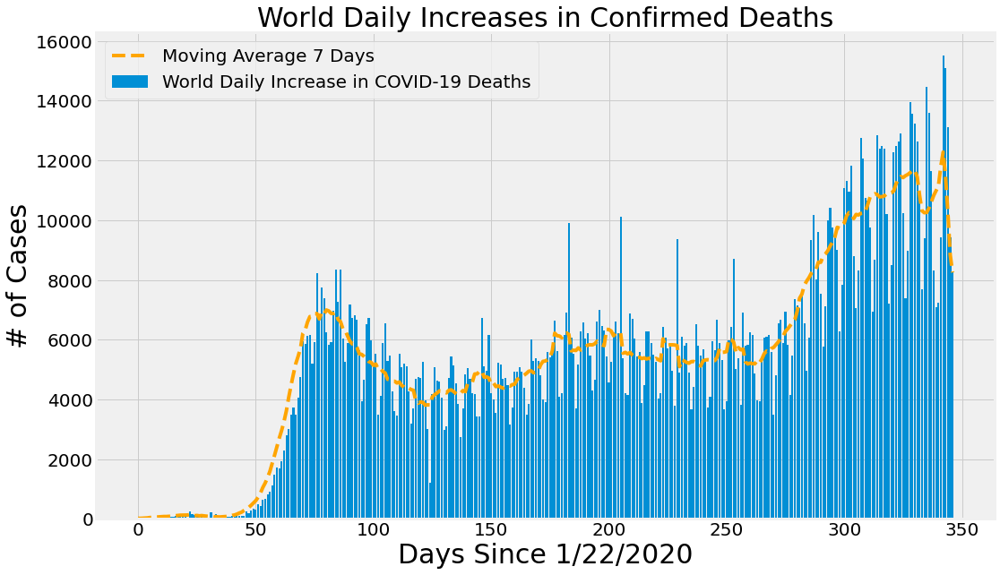

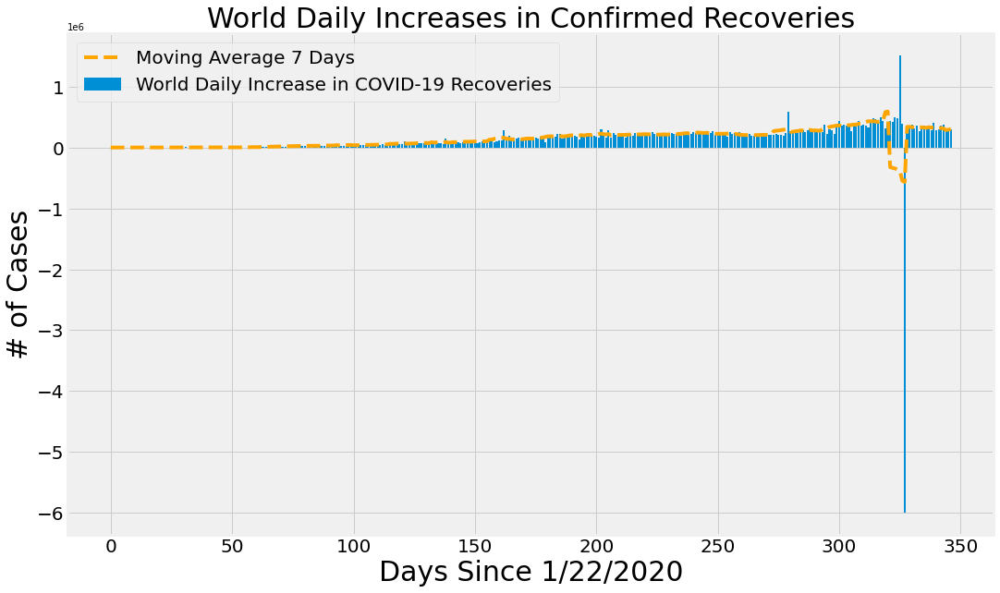

In [17]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_increase)
plt.plot(adjusted_dates, world_daily_increase_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Cases'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_recovery)
plt.plot(adjusted_dates, world_daily_recovery_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Recoveries', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Recoveries'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

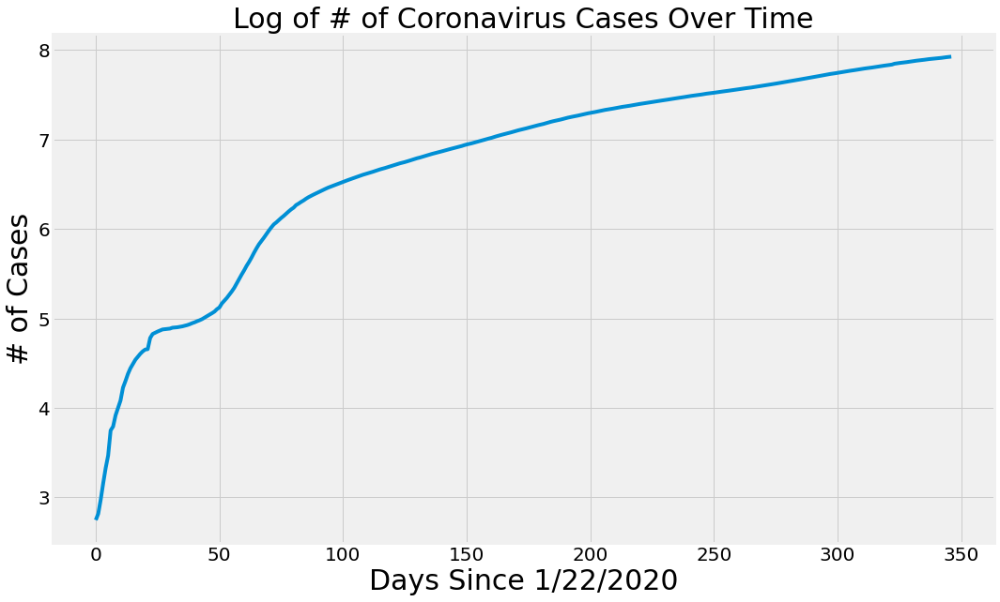

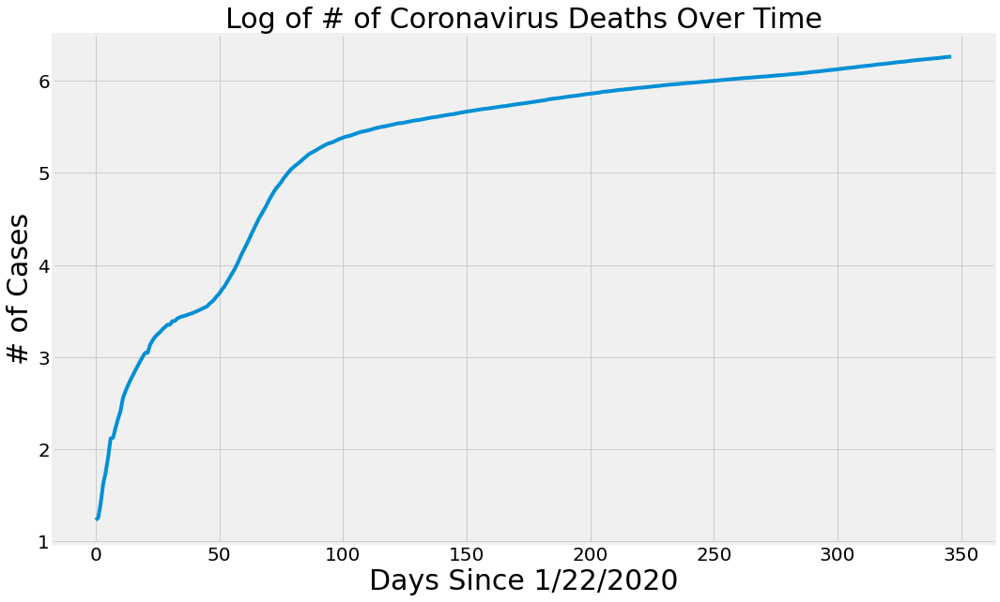

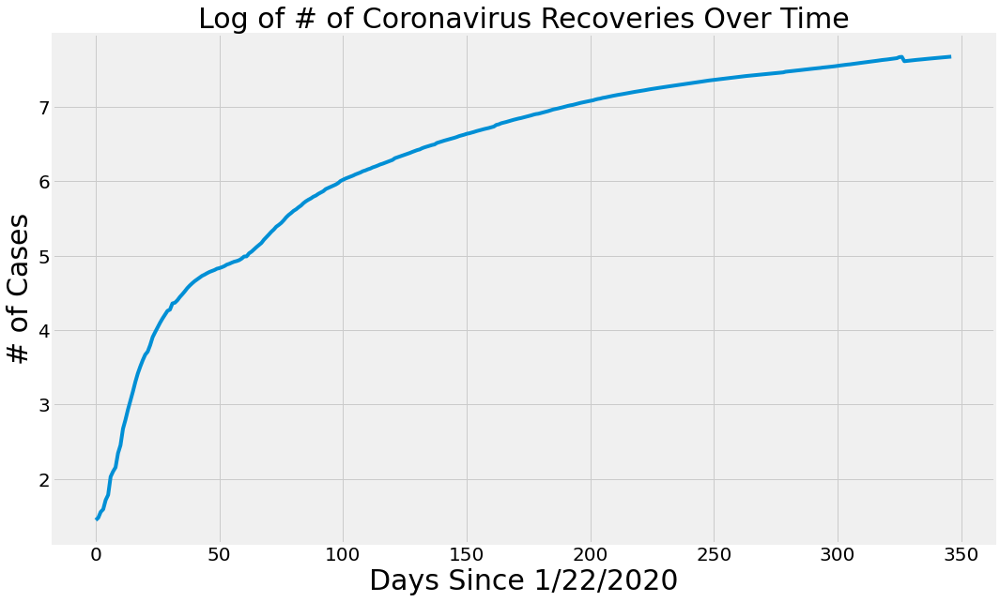

In [18]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(world_cases))
plt.title('Log of # of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_deaths))
plt.title('Log of # of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_recovered))
plt.title('Log of # of Coronavirus Recoveries Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

# Country Specific Graphs
<a id='country_graphs'></a>

In [34]:
def country_plot(x, y1, y2, y3, y4, country):
    # window is set as 14 in in the beginning of the notebook 
    confirmed_avg = moving_average(y1, window)
    confirmed_increase_avg = moving_average(y2, window)
    death_increase_avg = moving_average(y3, window)
    recovery_increase_avg = moving_average(y4, window)
    
    plt.figure(figsize=(16, 10))
    plt.plot(x, y1)
    plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
    plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
    plt.title('{} Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y2)
    plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y3)
    plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Deaths'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y4)
    plt.plot(x, recovery_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Recoveries'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Recoveries'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
      
# helper function for getting country's cases, deaths, and recoveries        
def get_country_info(country_name):
    country_cases = []
    country_deaths = []
    country_recoveries = []  
    
    for i in dates:
        country_cases.append(confirmed_df[confirmed_df['Country/Region']==country_name][i].sum())
        country_deaths.append(deaths_df[deaths_df['Country/Region']==country_name][i].sum())
        country_recoveries.append(recoveries_df[recoveries_df['Country/Region']==country_name][i].sum())
    return (country_cases, country_deaths, country_recoveries)
    
    
def country_visualizations(country_name):
    country_info = get_country_info(country_name)
    country_cases = country_info[0]
    country_deaths = country_info[1]
    country_recoveries = country_info[2]
    
    country_daily_increase = daily_increase(country_cases)
    country_daily_death = daily_increase(country_deaths)
    country_daily_recovery = daily_increase(country_recoveries)
    
    country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_daily_recovery, country_name)
    

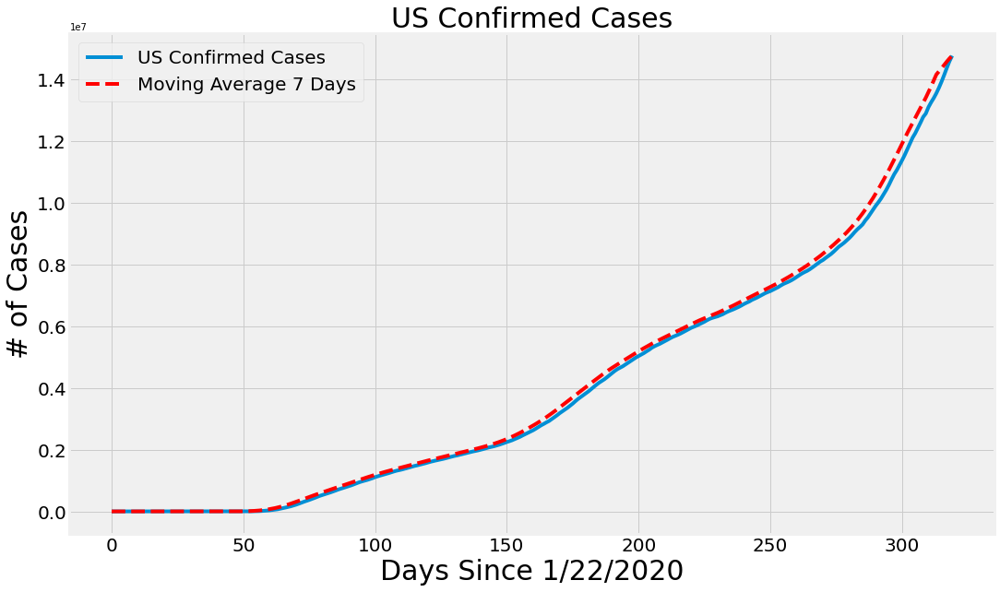

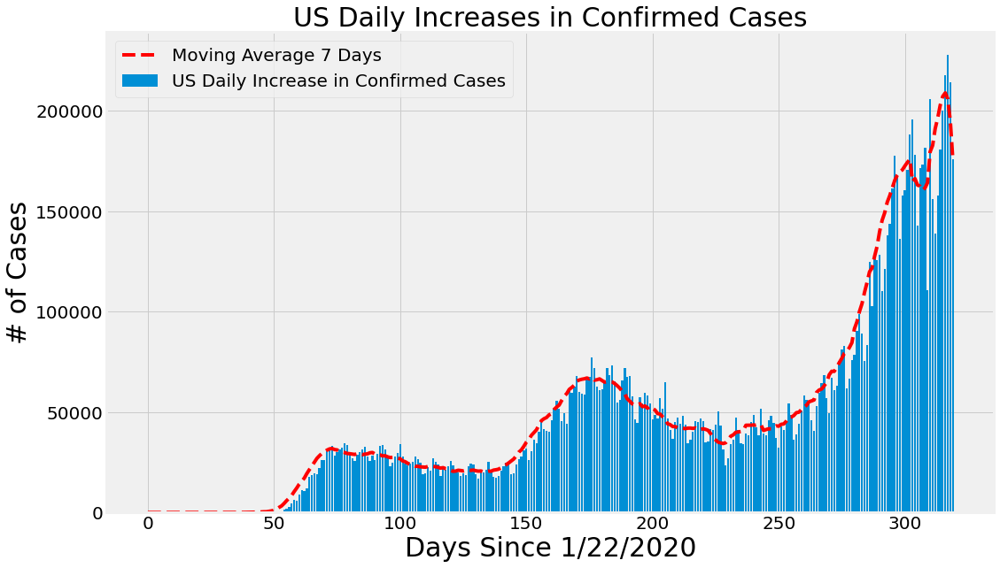

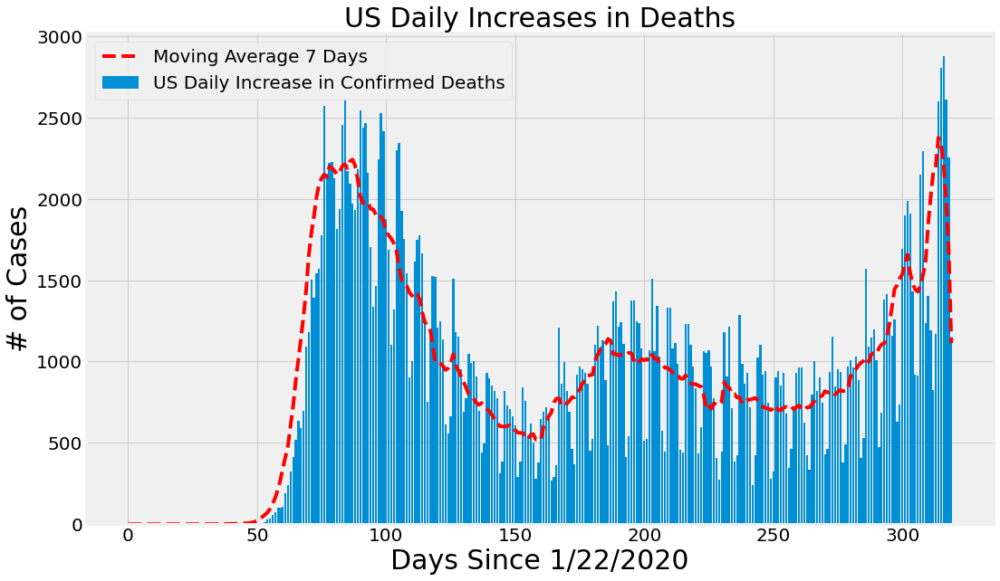

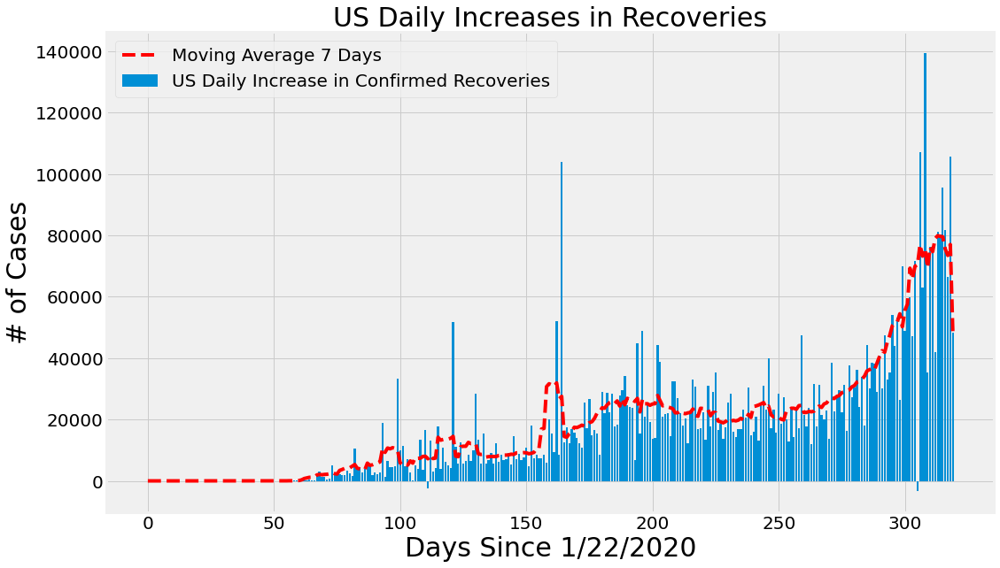

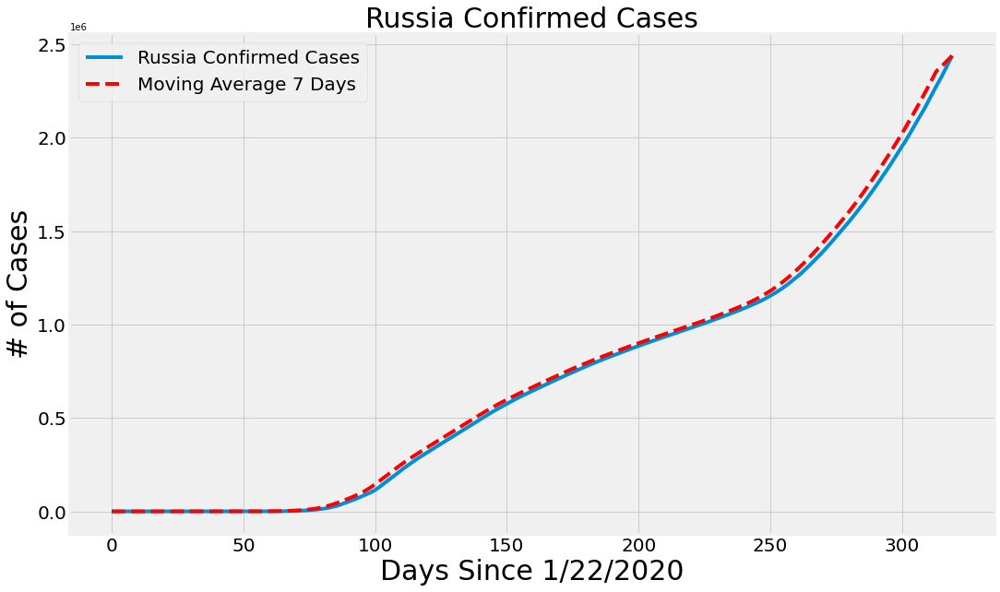

...

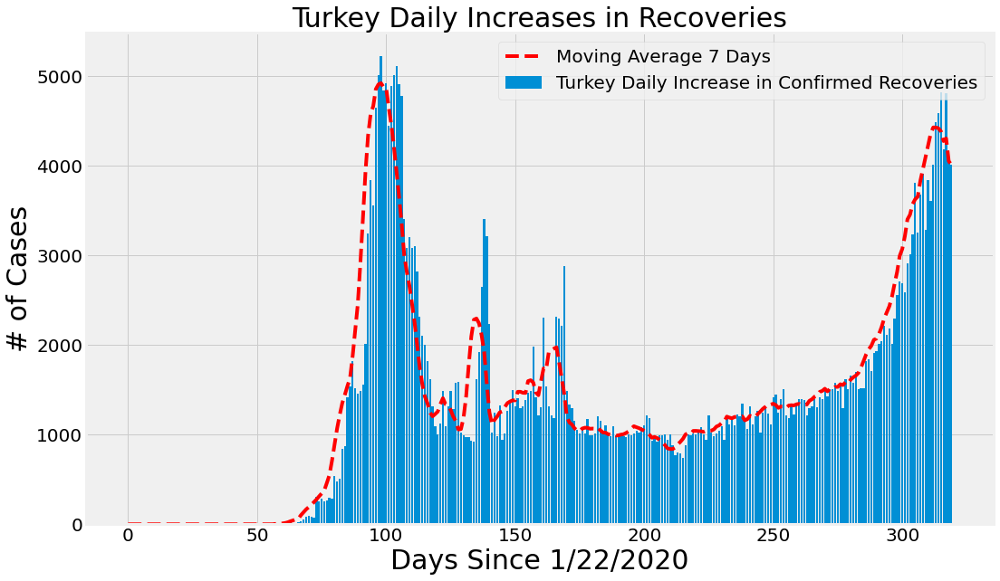

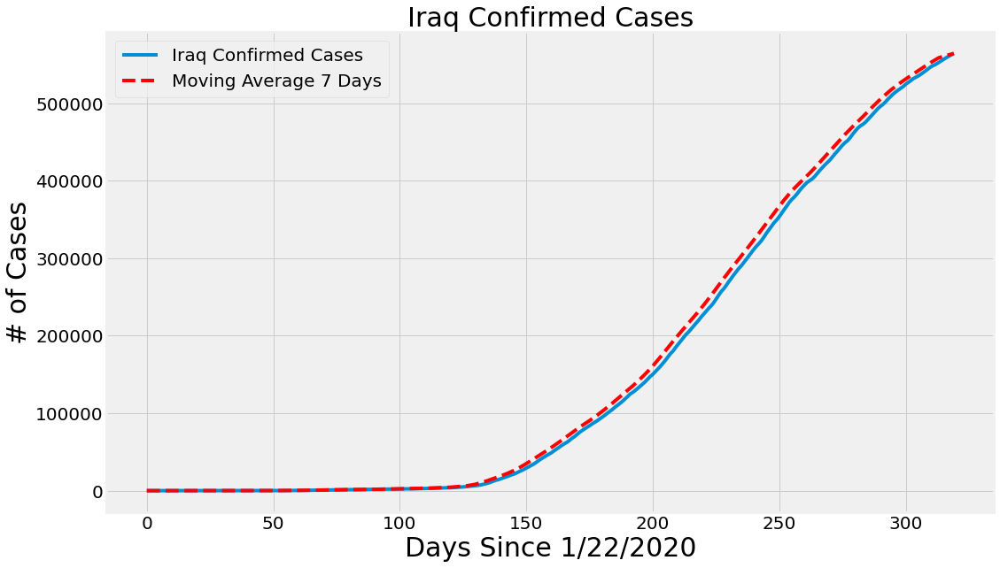

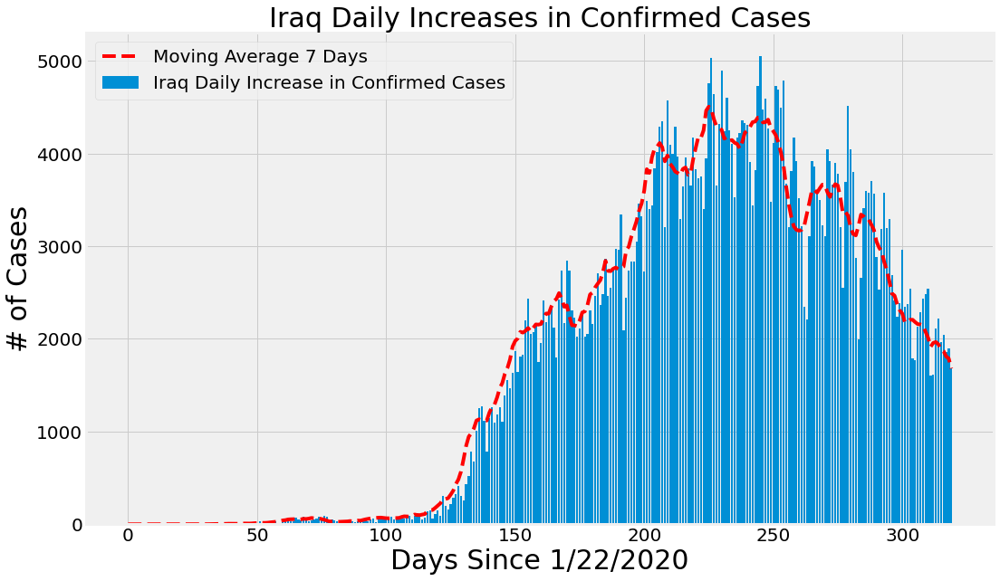

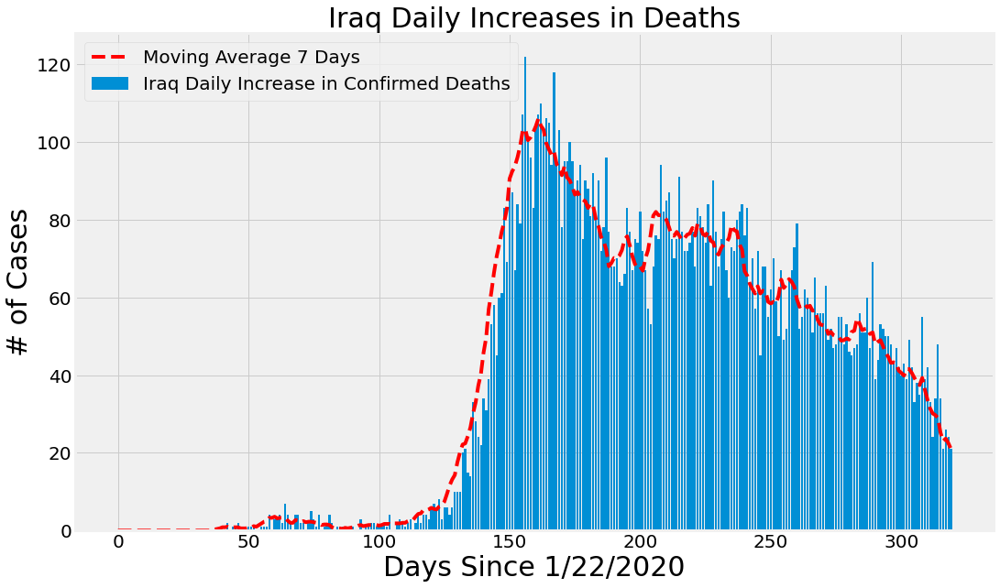

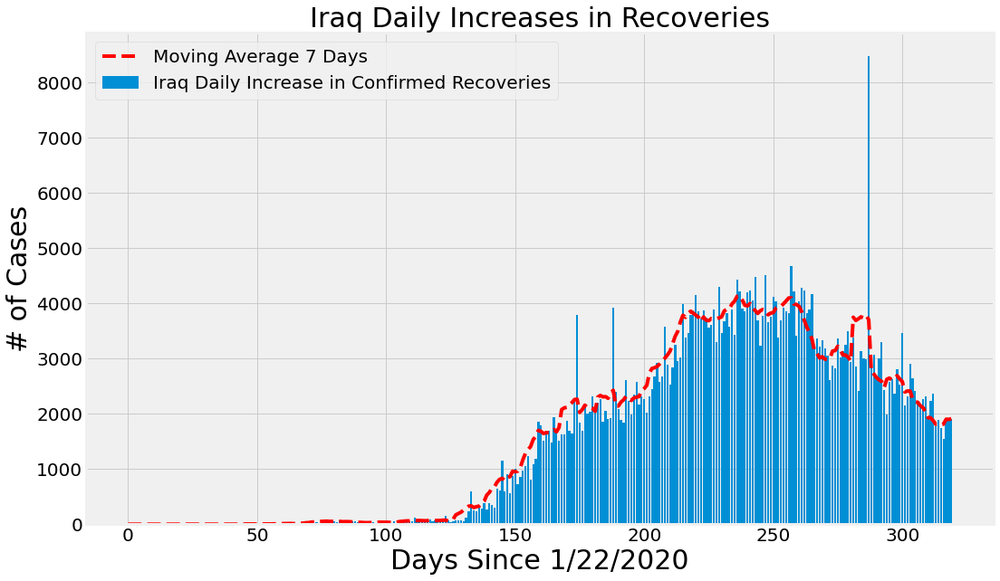

In [35]:
countries = ['US', 'Russia', 'India','China', 'Brazil', 
             'South Africa', 'Italy', 'Belgium','Switzerland',
             'Germany', 'Spain', 'France', 'United Kingdom',
             'Netherlands','Saudi Arabia', 'Iran', 'Pakistan', 'Turkey', 'Iraq'] 

for country in countries:
    country_visualizations(country)

### Country Comparison

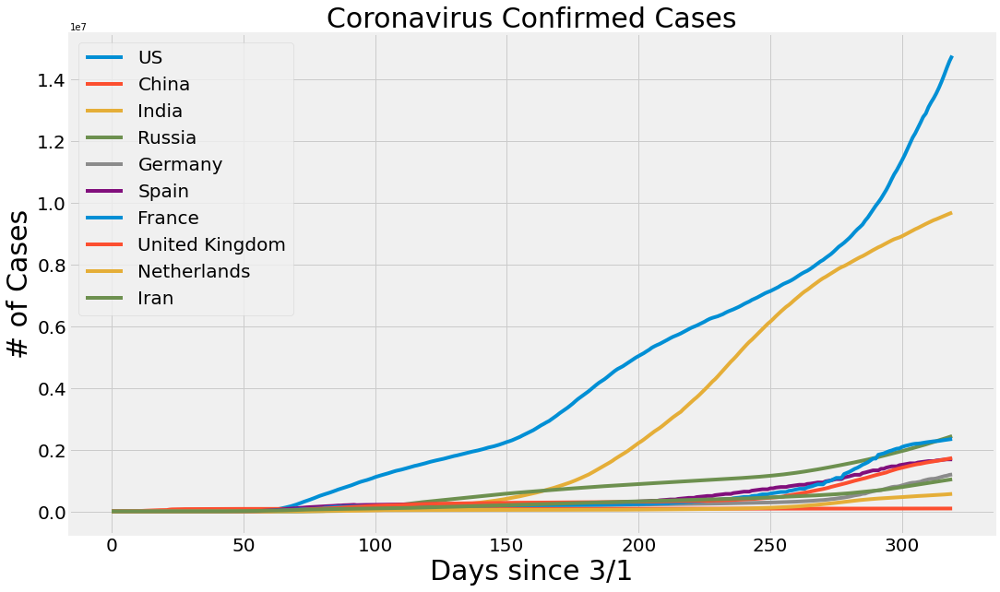

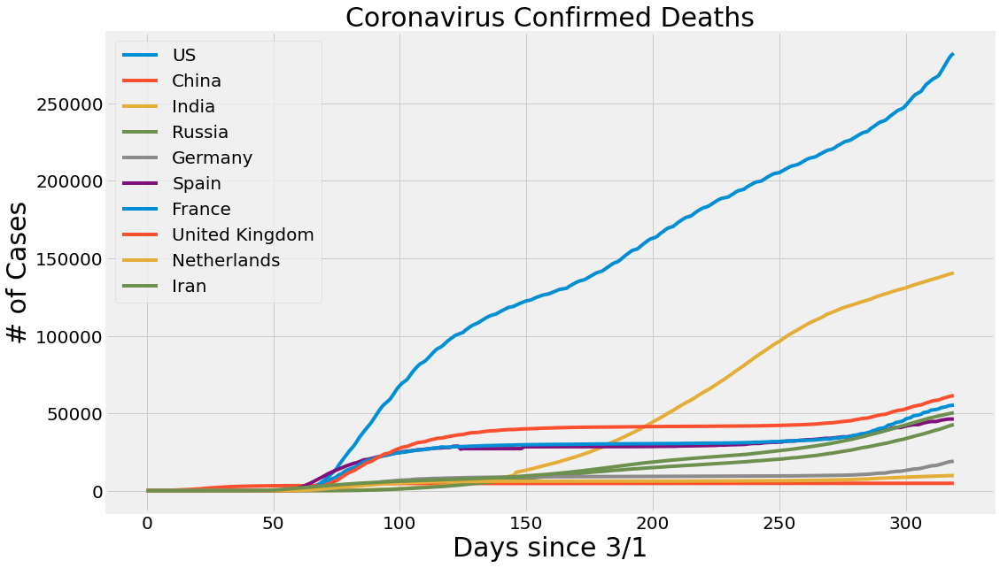

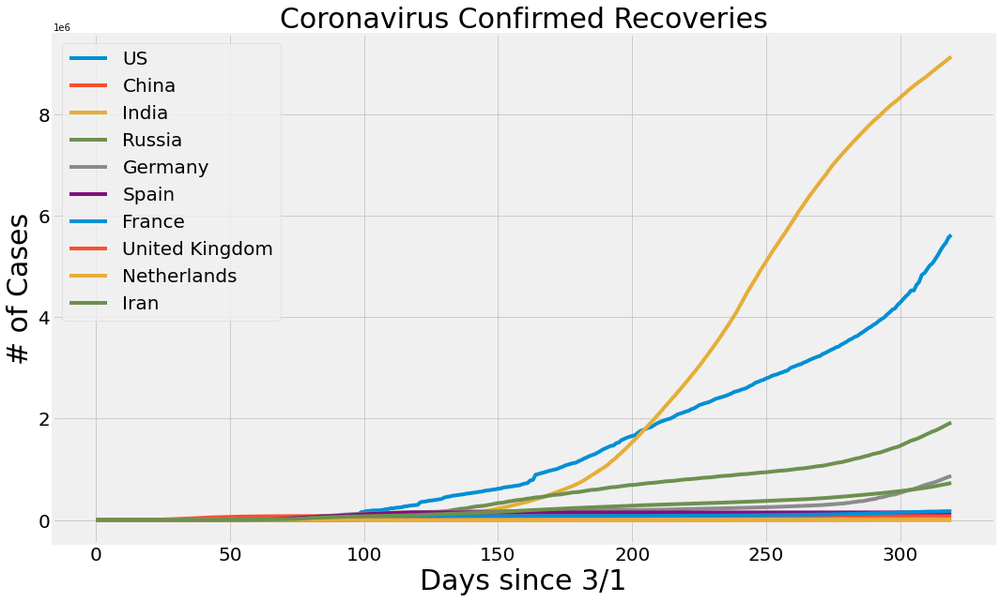

In [36]:
# Country Comparison
# removed redundant code

compare_countries = ['US', 'China', 'India', 'Russia', 'Germany', 'Spain','France', 'United Kingdom', 'Netherlands', 'Iran'] 
graph_name = ['Coronavirus Confirmed Cases', 'Coronavirus Confirmed Deaths', 'Coronavirus Confirmed Recoveries']

for num in range(3):
    plt.figure(figsize=(16, 10))
    for country in compare_countries:
        plt.plot(get_country_info(country)[num])
    plt.legend(compare_countries, prop={'size': 20})
    plt.xlabel('Days since 3/1', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

# Predictions for confirmed coronavirus cases worldwide
<a id='prediction'></a>

In [37]:
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 10))
    plt.plot(x, y)
    plt.plot(future_forcast, pred, linestyle='dashed', color=color)
    plt.title('Worldwide Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

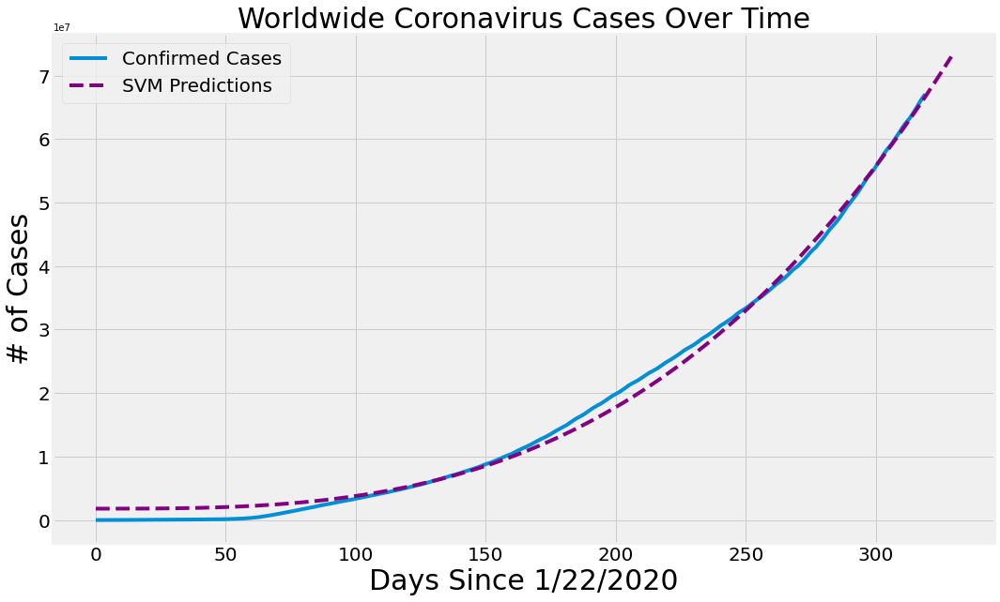

In [38]:
plot_predictions(adjusted_dates, world_cases, svm_pred, 'SVM Predictions', 'purple')

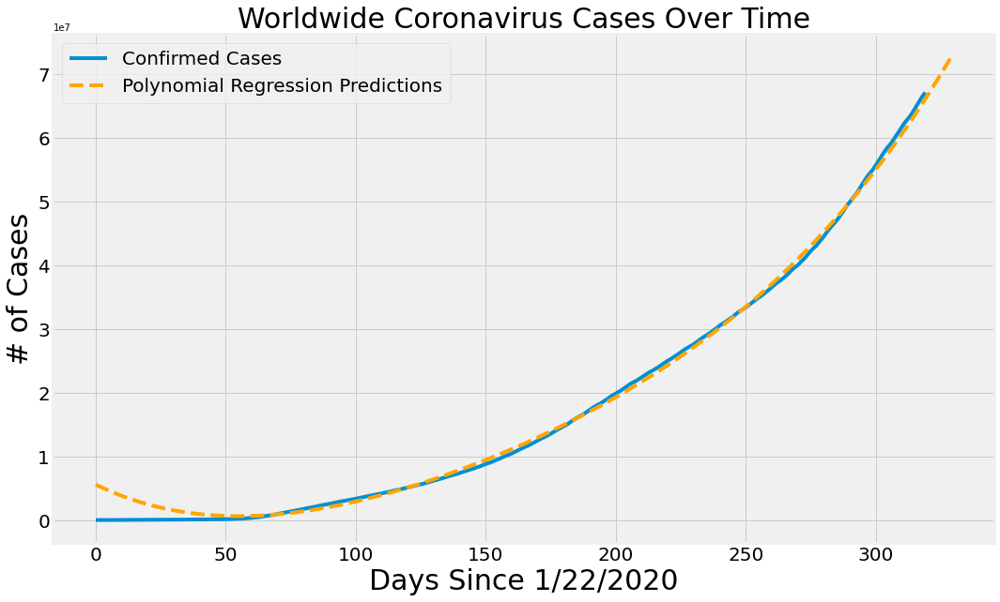

In [39]:
plot_predictions(adjusted_dates, world_cases, linear_pred, 'Polynomial Regression Predictions', 'orange')

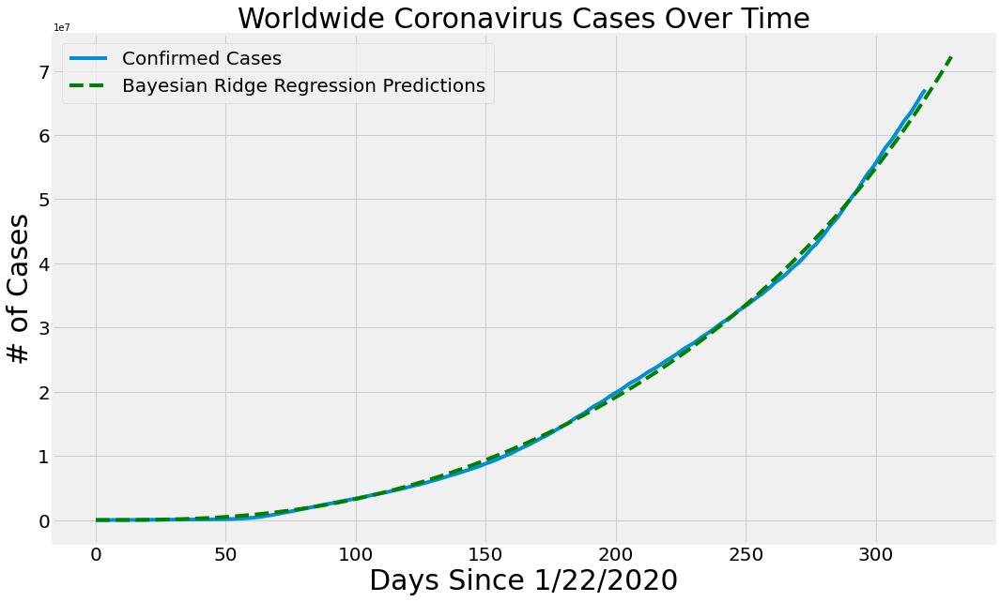

In [40]:
plot_predictions(adjusted_dates, world_cases, bayesian_pred, 'Bayesian Ridge Regression Predictions', 'green')

In [41]:
# Future predictions using SVM 
svm_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'SVM Predicted # of Confirmed Cases Worldwide': np.round(svm_pred[-10:])})
svm_df.style.background_gradient(cmap='Reds')

,Date,SVM Predicted # of Confirmed Cases Worldwide
0,12/07/2020,67292123.000000
1,12/08/2020,67908116.000000
2,12/09/2020,68527959.000000
3,12/10/2020,69151664.000000
4,12/11/2020,69779243.000000
5,12/12/2020,70410708.000000
6,12/13/2020,71046071.000000
7,12/14/2020,71685344.000000
8,12/15/2020,72328538.000000
9,12/16/2020,72975667.000000


In [42]:
# Future predictions using polynomial regression
linear_pred = linear_pred.reshape(1,-1)[0]
linear_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Polynomial Predicted # of Confirmed Cases Worldwide': np.round(linear_pred[-10:])})
linear_df.style.background_gradient(cmap='Reds')

,Date,Polynomial Predicted # of Confirmed Cases Worldwide
0,12/07/2020,66689950.000000
1,12/08/2020,67333093.000000
2,12/09/2020,67982150.000000
3,12/10/2020,68637175.000000
4,12/11/2020,69298222.000000
5,12/12/2020,69965345.000000
6,12/13/2020,70638602.000000
7,12/14/2020,71318045.000000
8,12/15/2020,72003733.000000
9,12/16/2020,72695720.000000


In [43]:
# Future predictions using Bayesian Ridge 
bayesian_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Bayesian Ridge Predicted # of Confirmed Cases Worldwide': np.round(bayesian_pred[-10:])})
bayesian_df.style.background_gradient(cmap='Reds')

,Date,Bayesian Ridge Predicted # of Confirmed Cases Worldwide
0,12/07/2020,66351110.000000
1,12/08/2020,66979751.000000
2,12/09/2020,67614160.000000
3,12/10/2020,68254397.000000
4,12/11/2020,68900528.000000
5,12/12/2020,69552616.000000
6,12/13/2020,70210725.000000
7,12/14/2020,70874922.000000
8,12/15/2020,71545271.000000
9,12/16/2020,72221841.000000


Mortality Rate (worldwide) **susceptible to change **

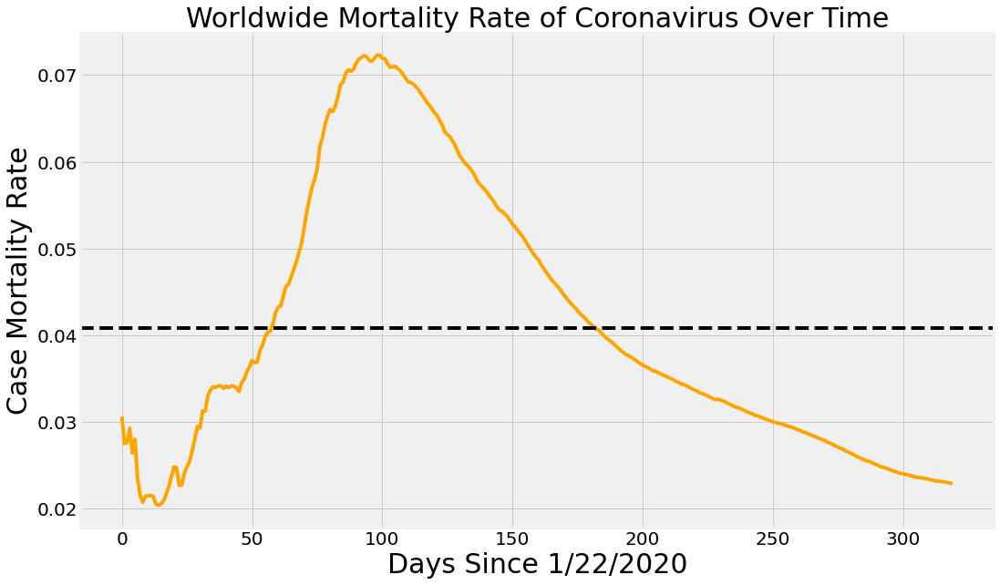

In [44]:
mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y = mean_mortality_rate,linestyle='--', color='black')
plt.title('Worldwide Mortality Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Mortality Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Recovery Rate (worldwide) **suceptible to change **

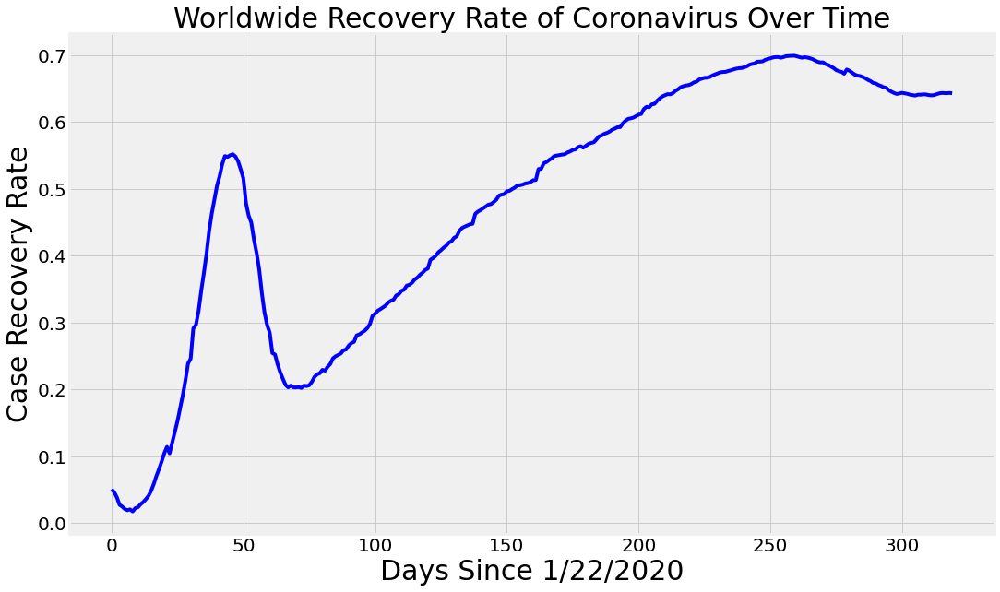

In [45]:
mean_recovery_rate = np.mean(recovery_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, recovery_rate, color='blue')
plt.title('Worldwide Recovery Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Recovery Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Graphing deaths against recoveries

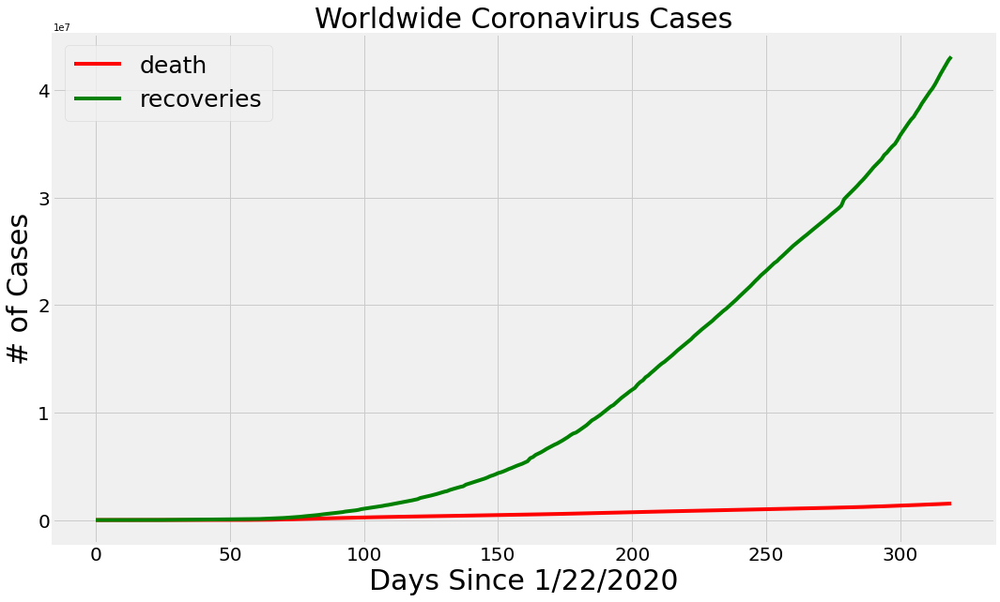

In [46]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_deaths, color='r')
plt.plot(adjusted_dates, total_recovered, color='green')
plt.legend(['death', 'recoveries'], loc='best', fontsize=25)
plt.title('Worldwide Coronavirus Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Plotting the number of deaths against the number of recoveries

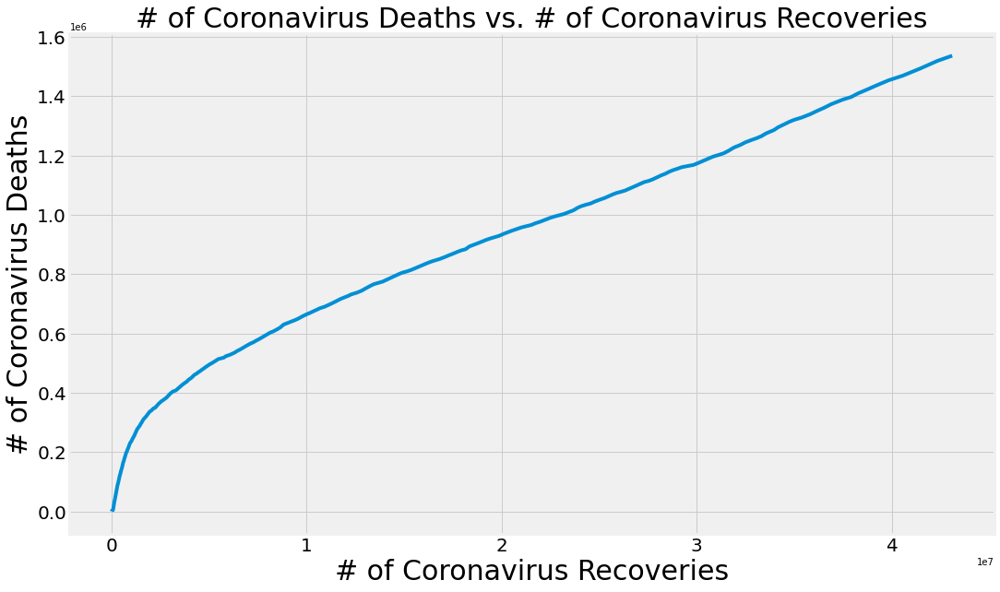

In [47]:
plt.figure(figsize=(16, 10))
plt.plot(total_recovered, total_deaths)
plt.title('# of Coronavirus Deaths vs. # of Coronavirus Recoveries', size=30)
plt.xlabel('# of Coronavirus Recoveries', size=30)
plt.ylabel('# of Coronavirus Deaths', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Getting information about **countries/regions** that have confirmed coronavirus cases

In [48]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2020-12-06 05:26:18,33.93911,67.709953,47072,1864,37393,7815.0,Afghanistan,120.919615,3.959891
1,NaN,NaN,NaN,Albania,2020-12-06 05:26:18,41.15330,20.168300,42148,889,21286,19973.0,Albania,1464.591007,2.109234
2,NaN,NaN,NaN,Algeria,2020-12-06 05:26:18,28.03390,1.659600,87502,2501,56617,28384.0,Algeria,199.543714,2.858220
3,NaN,NaN,NaN,Andorra,2020-12-06 05:26:18,42.50630,1.521800,7005,78,6171,756.0,Andorra,9066.200738,1.113490
4,NaN,NaN,NaN,Angola,2020-12-06 05:26:18,-11.20270,17.873900,15536,354,8335,6847.0,Angola,47.270350,2.278579


In [49]:
unique_countries =  list(latest_data['Country_Region'].unique())

In [50]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
country_recovery_cases = []
country_incidence_rate = [] 
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
    country_recovery_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Recovered'].sum())
    country_active_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Active'].sum())
    country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])

# Data table
<a id='data_table'></a>

In [51]:
country_df = pd.DataFrame({'Country Name': unique_countries, 'Number of Confirmed Cases': country_confirmed_cases,
                          'Number of Deaths': country_death_cases, 'Number of Recoveries' : country_recovery_cases, 
                          'Number of Active Cases' : country_active_cases, 'Incidence Rate' : country_incidence_rate,
                          'Mortality Rate': country_mortality_rate})
# number of cases per country/region

country_df.style.background_gradient(cmap='Oranges')

,Country Name,Number of Confirmed Cases,Number of Deaths,Number of Recoveries,Number of Active Cases,Incidence Rate,Mortality Rate
0,US,14581337,281186,5576026,8724125.000000,15749191.606311,0.019284
1,India,9644222,140182,9100792,403248.000000,35569.127282,0.014535
2,Brazil,6577177,176628,5864838,535711.000000,111231.927579,0.026855
3,Russia,2410462,42228,1899474,468760.000000,143777.475230,0.017519
4,France,2334626,55073,174992,2104561.000000,22712.069632,0.023590
5,United Kingdom,1710379,61111,3650,1645618.000000,18455.477069,0.035730
6,Italy,1709991,59514,896308,754169.000000,57768.536103,0.034804
7,Spain,1684647,46252,150376,1488019.000000,70523.543199,0.027455
8,Argentina,1459832,39632,1288785,131415.000000,3230.018592,0.027148
9,Colombia,1362249,37633,1249702,74914.000000,78101.259530,0.027626


In [52]:
unique_provinces =  list(latest_data['Province_State'].unique())

Getting the latest information about **provinces/states** that have confirmed coronavirus cases

In [53]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
# province_recovery_cases = []
province_active = [] 
province_incidence_rate = []
province_mortality_rate = [] 

no_cases = [] 
for i in unique_provinces:
    cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
# remove areas with no confirmed cases

for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = latest_data[latest_data['Province_State']==unique_provinces[i]]['Confirmed'].sum()
    province_country.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Country_Region'].unique()[0])
    province_death_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Deaths'].sum())
#     province_recovery_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Recovered'].sum())
    province_active.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Active'].sum())
    province_incidence_rate.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Incident_Rate'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])

In [54]:
# nan_indices = [] 

# # handle nan if there is any, it is usually a float: float('nan')

# for i in range(len(unique_provinces)):
#     if type(unique_provinces[i]) == float:
#         nan_indices.append(i)

# unique_provinces = list(unique_provinces)
# province_confirmed_cases = list(province_confirmed_cases)

# for i in nan_indices:
#     unique_provinces.pop(i)
#     province_confirmed_cases.pop(i)

In [55]:
# number of cases per province/state/city top 100 
province_limit = 100 
province_df = pd.DataFrame({'Province/State Name': unique_provinces[:province_limit], 'Country': province_country[:province_limit], 'Number of Confirmed Cases': province_confirmed_cases[:province_limit],
                          'Number of Deaths': province_death_cases[:province_limit],'Number of Active Cases' : province_active[:province_limit], 
                            'Incidence Rate' : province_incidence_rate[:province_limit], 'Mortality Rate': province_mortality_rate[:province_limit]})
# number of cases per country/region

province_df.style.background_gradient(cmap='Oranges')

,Province/State Name,Country,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Maharashtra,India,1847509,47694,83931.000000,1500.280691,0.025815
1,England,United Kingdom,1464803,53369,1411434.000000,2616.785048,0.036434
2,California,US,1337941,19870,1318071.000000,174269.304405,0.014851
3,Texas,US,1311643,23055,1288588.000000,1074974.527785,0.017577
4,Sao Paulo,Brazil,1285087,42969,107012.000000,2798.592366,0.033437
5,Florida,US,1049638,19084,1030554.000000,349123.517296,0.018182
6,Karnataka,India,891685,11846,24978.000000,1319.789151,0.013285
7,Andhra Pradesh,India,871305,7024,6166.000000,1616.419582,0.008061
8,Tamil Nadu,India,788920,11777,10882.000000,1013.498406,0.014928
9,Illinois,US,779975,14016,765959.000000,630960.783041,0.017970


In [56]:
# return the data table with province/state info for a given country
def country_table(country_name):
    states = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    state_confirmed_cases = []
    state_death_cases = [] 
    # state_recovery_cases = []
    state_active = [] 
    state_incidence_rate = [] 
    state_mortality_rate = [] 

    no_cases = [] 
    for i in states:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            state_confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        states.remove(i)

    states = [k for k, v in sorted(zip(states, state_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
    for i in range(len(states)):
        state_confirmed_cases[i] = latest_data[latest_data['Province_State']==states[i]]['Confirmed'].sum()
        state_death_cases.append(latest_data[latest_data['Province_State']==states[i]]['Deaths'].sum())
    #     state_recovery_cases.append(latest_data[latest_data['Province_State']==states[i]]['Recovered'].sum())
        state_active.append(latest_data[latest_data['Province_State']==states[i]]['Active'].sum())
        state_incidence_rate.append(latest_data[latest_data['Province_State']==states[i]]['Incident_Rate'].sum())
        state_mortality_rate.append(state_death_cases[i]/state_confirmed_cases[i])
        
      
    state_df = pd.DataFrame({'State Name': states, 'Number of Confirmed Cases': state_confirmed_cases,
                              'Number of Deaths': state_death_cases, 'Number of Active Cases' : state_active, 
                             'Incidence Rate' : state_incidence_rate, 'Mortality Rate': state_mortality_rate})
    # number of cases per country/region
    return state_df

Data table for the **United States**

In [57]:
us_table = country_table('US')
us_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,California,1337941,19870,1318071.000000,174269.304405,0.014851
1,Texas,1311643,23055,1288588.000000,1074974.527785,0.017577
2,Florida,1049638,19084,1030554.000000,349123.517296,0.018182
3,Illinois,779975,14016,765959.000000,630960.783041,0.017970
4,New York,696125,34900,661225.000000,138523.205983,0.050135
5,Georgia,499371,9793,489578.000000,783466.680652,0.019611
6,Ohio,467432,6946,460486.000000,346964.579350,0.014860
7,Wisconsin,437918,3934,433984.000000,532963.489171,0.008983
8,Michigan,426576,10321,416255.000000,308759.897047,0.024195
9,Pennsylvania,415635,11191,404444.000000,194046.416390,0.026925


Data table for **Brazil**

In [58]:
brazil_table = country_table('Brazil')
brazil_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Sao Paulo,1285087,42969,107012.000000,2798.592366,0.033437
1,Minas Gerais,438304,10283,30446.000000,2070.519757,0.023461
2,Bahia,419044,8388,11394.000000,2817.469218,0.020017
3,Santa Catarina,393602,3980,32014.000000,5493.561010,0.010112
4,Rio de Janeiro,370267,23099,8662.000000,2144.617564,0.062385
5,Rio Grande do Sul,346801,7166,22503.000000,3048.200007,0.020663
6,Ceara,304443,9693,41014.000000,3333.775730,0.031838
7,Parana,300271,6421,80098.000000,2626.133717,0.021384
8,Goias,285953,6455,4337.000000,4074.359886,0.022574
9,Para,274545,6944,10940.000000,3191.320566,0.025293


Data table for **India**

In [59]:
india_table = country_table('India')
india_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Maharashtra,1847509,47694,83931.000000,1500.280691,0.025815
1,Karnataka,891685,11846,24978.000000,1319.789151,0.013285
2,Andhra Pradesh,871305,7024,6166.000000,1616.419582,0.008061
3,Tamil Nadu,788920,11777,10882.000000,1013.498406,0.014928
4,Kerala,631615,2390,61531.000000,1769.257296,0.003784
5,Delhi,589544,9574,26678.000000,3150.801441,0.016240
6,Uttar Pradesh,553012,7900,22245.000000,232.472535,0.014285
7,West Bengal,499697,8677,23964.000000,501.656959,0.017365
8,Odisha,320803,1765,3768.000000,692.037036,0.005502
9,Rajasthan,278496,2409,23176.000000,343.683523,0.008650


Data table for **Russia**

In [60]:
russia_table = country_table('Russia')
russia_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Moscow,640050,9277,145465.000000,5117.751870,0.014494
1,Saint Petersburg,144400,5783,55059.000000,2698.089569,0.040048
2,Moscow Oblast,116940,2224,31217.000000,1558.496599,0.019018
3,Nizhny Novgorod Oblast,56892,1245,4347.000000,1758.774707,0.021884
4,Sverdlovsk Oblast,48233,1090,6669.000000,1115.147866,0.022599
5,Rostov Oblast,41700,1453,6460.000000,988.045830,0.034844
6,Krasnoyarsk Krai,37899,1225,6295.000000,1317.540050,0.032323
7,Voronezh Oblast,36201,668,1604.000000,1551.182465,0.018453
8,Khanty-Mansi Autonomous Okrug,35439,436,4366.000000,2312.883792,0.012303
9,Irkutsk Oblast,33466,857,2919.000000,1391.983595,0.025608


Data table for **China**

In [61]:
china_table = country_table('China')
china_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Hubei,68149,4512,4.000000,115.174920,0.066208
1,Hong Kong,6802,112,1179.000000,90.729770,0.016466
2,Guangdong,2002,8,36.000000,1.764499,0.003996
3,Shanghai,1359,7,61.000000,5.606436,0.005151
4,Henan,1295,22,7.000000,1.348256,0.016988
5,Zhejiang,1294,1,5.000000,2.255534,0.000773
6,Hunan,1020,4,0.000000,1.478475,0.003922
7,Anhui,992,6,0.000000,1.568627,0.006048
8,Xinjiang,980,3,0.000000,3.940491,0.003061
9,Beijing,952,9,4.000000,4.419684,0.009454


Data table for **United Kingdom**

In [62]:
uk_table = country_table('United Kingdom')
uk_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,England,1464803,53369,1411434.000000,2616.785048,0.036434
1,Scotland,99463,3911,95552.000000,1820.566324,0.039321
2,Wales,87077,2695,84382.000000,2774.389855,0.030950
3,Northern Ireland,54628,1039,53589.000000,2903.273810,0.019020
4,Unknown,23814,17282,-1757121.000000,0.000000,0.725708
5,Channel Islands,1549,48,489.000000,908.509727,0.030988
6,Gibraltar,1048,5,63.000000,3110.623015,0.004771
7,Turks and Caicos Islands,756,6,10.000000,1952.580195,0.007937
8,Isle of Man,370,25,1.000000,435.130304,0.067568
9,Bermuda,288,9,63.000000,462.479726,0.031250


Data table for **France**

In [63]:
france_table = country_table('France')
france_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,French Polynesia,15107,79,10186.000000,5377.993905,0.005229
1,French Guiana,11407,71,1341.000000,3819.111965,0.006224
2,Guadeloupe,8427,149,6036.000000,2106.081319,0.017681
3,Reunion,8200,41,430.000000,915.885930,0.005000
4,Martinique,5520,41,5381.000000,1470.960521,0.007428
5,Mayotte,5181,49,2168.000000,1899.103049,0.009458
6,St Martin,717,12,64.000000,1854.678083,0.016736
7,Saint Barthelemy,147,1,41.000000,1487.101669,0.006803
8,New Caledonia,35,0,3.000000,12.259581,0.000000
9,Saint Pierre and Miquelon,16,0,2.000000,276.100086,0.000000


Data table for **Italy**

In [64]:
italy_table = country_table('Italy')
italy_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Lombardia,426696,22884,115756.000000,4241.268938,0.053631
1,Piemonte,176519,6568,66763.000000,4051.940981,0.037208
2,Campania,163741,1958,101361.000000,2822.297357,0.011958
3,Veneto,161805,4173,74958.000000,3298.202515,0.025790
4,Emilia-Romagna,131973,6074,69629.000000,2959.382905,0.046025
5,Lazio,128623,2608,93479.000000,2187.807552,0.020276
6,Toscana,107644,2839,30544.000000,2886.175908,0.026374
7,Sicilia,70467,1723,39540.000000,1409.370724,0.024451
8,Puglia,62552,1688,44160.000000,1552.523633,0.026986
9,Liguria,53475,2501,10518.000000,3448.576072,0.046770


Data table for **Spain**

In [65]:
spain_table = country_table('Spain')
spain_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Madrid,354326,11426,302164.000000,5334.910050,0.032247
1,Catalonia,310141,8126,275812.000000,4098.907398,0.026201
2,Andalusia,238783,4296,223816.000000,2833.410759,0.017991
3,Castilla y Leon,123433,4647,110070.000000,5126.523580,0.037648
4,C. Valenciana,108586,2444,96172.000000,2182.646766,0.022508
5,Pais Vasco,99716,2568,80988.000000,4578.581005,0.025753
6,Castilla - La Mancha,87956,3825,77739.000000,4322.423419,0.043488
7,Aragon,74534,2360,68402.000000,5644.009553,0.031663
8,Murcia,55116,623,52313.000000,3704.871332,0.011303
9,Galicia,51557,1246,41107.000000,1909.206681,0.024167


Data table for **Germany**

In [66]:
germany_table = country_table('Germany')
germany_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Nordrhein-Westfalen,284815,3924,65147.000000,1588.248163,0.013777
1,Bayern,229675,4289,57563.000000,1756.365376,0.018674
2,Baden-Wurttemberg,164843,3007,43554.000000,1489.159479,0.018242
3,Hessen,95954,1460,26955.000000,1531.390440,0.015216
4,Niedersachsen,77033,1261,12843.000000,965.029775,0.016370
5,Berlin,71088,679,20704.000000,1950.381170,0.009552
6,Sachsen,68244,1279,25705.000000,1673.493239,0.018742
7,Rheinland-Pfalz,48779,666,16550.000000,1194.145970,0.013653
8,Hamburg,26624,419,7153.000000,1446.029962,0.015738
9,Unknown,23814,17282,-1757121.000000,0.000000,0.725708


<a id='bar_charts'></a>
# Bar Chart Visualizations for COVID-19
This offers us some insights for how different countries/regions compare in terms of covid cases.

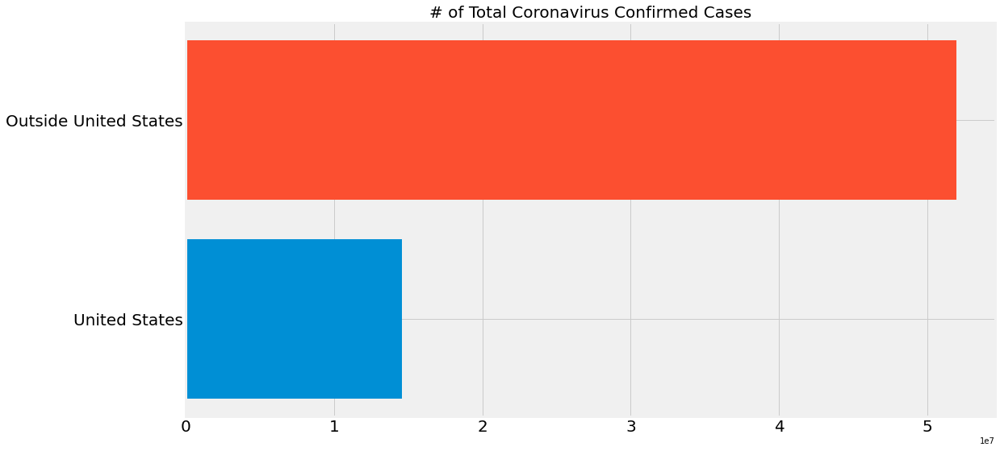

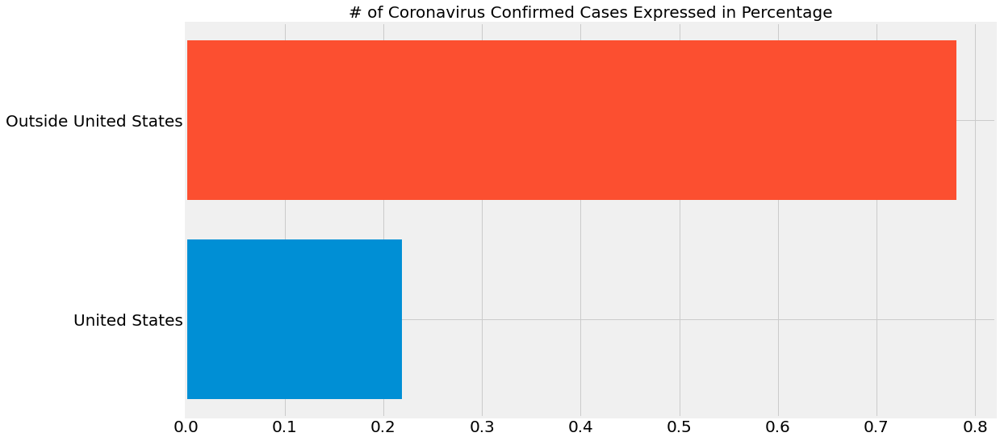

In [67]:
total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region']=='US']['Confirmed'].sum()
outside_us_confirmed = total_world_cases - us_confirmed

plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed)
plt.barh('Outside United States', outside_us_confirmed)
plt.title('# of Total Coronavirus Confirmed Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed/total_world_cases)
plt.barh('Outside United States', outside_us_confirmed/total_world_cases)
plt.title('# of Coronavirus Confirmed Cases Expressed in Percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [68]:
print('Outside United States {} cases ({}%):'.format(outside_us_confirmed, np.round((outside_us_confirmed/total_world_cases)*100, 1)))
print('United States {} cases ({}%)'.format(us_confirmed, np.round((us_confirmed/total_world_cases)*100, 1)))
print('Total: {} cases'.format(total_world_cases))

Outside United States 51958697 cases (78.1%):
United States 14581337 cases (21.9%)
Total: 66540034 cases


In [69]:
# Only show 15 countries with the most confirmed cases, the rest are grouped into the other category
visual_unique_countries = [] 
visual_confirmed_cases = []
others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
    visual_unique_countries.append(unique_countries[i])
    visual_confirmed_cases.append(country_confirmed_cases[i])
    
visual_unique_countries.append('Others')
visual_confirmed_cases.append(others)

***Visual Representations*** (bar charts and pie charts)

In [70]:
def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 12))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    
# good for a lot x values 
def plot_bar_graphs_tall(x, y, title):
    plt.figure(figsize=(19, 18))
    plt.barh(x, y)
    plt.title(title, size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()

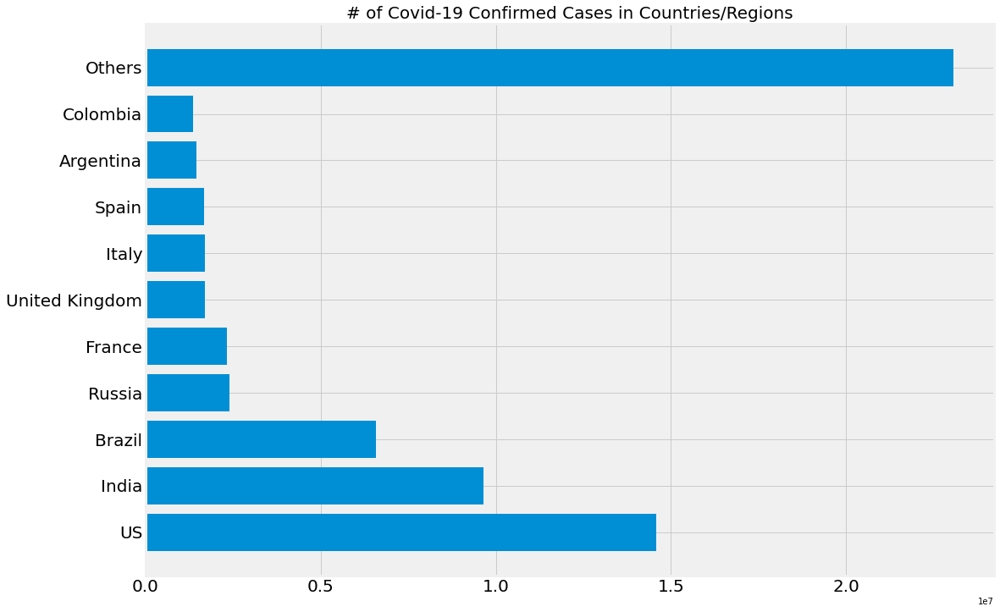

In [71]:
plot_bar_graphs(visual_unique_countries, visual_confirmed_cases, '# of Covid-19 Confirmed Cases in Countries/Regions')

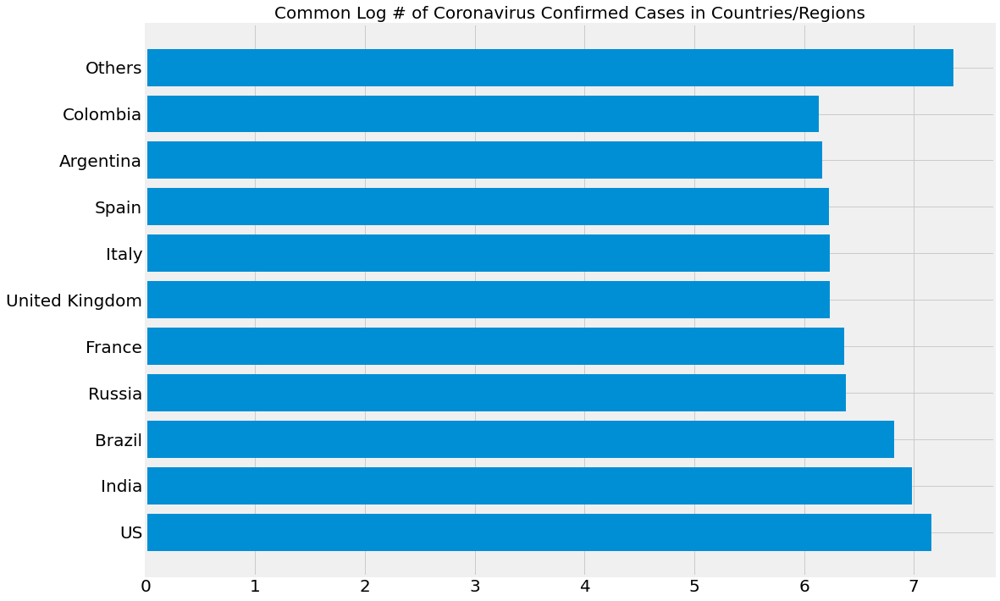

In [72]:
log_country_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases]
plot_bar_graphs(visual_unique_countries, log_country_confirmed_cases, 'Common Log # of Coronavirus Confirmed Cases in Countries/Regions')

In [73]:
# Only show 10 provinces with the most confirmed cases, the rest are grouped into the other category
visual_unique_provinces = [] 
visual_confirmed_cases2 = []
others = np.sum(province_confirmed_cases[10:])
for i in range(len(province_confirmed_cases[:10])):
    visual_unique_provinces.append(unique_provinces[i])
    visual_confirmed_cases2.append(province_confirmed_cases[i])

visual_unique_provinces.append('Others')
visual_confirmed_cases2.append(others)

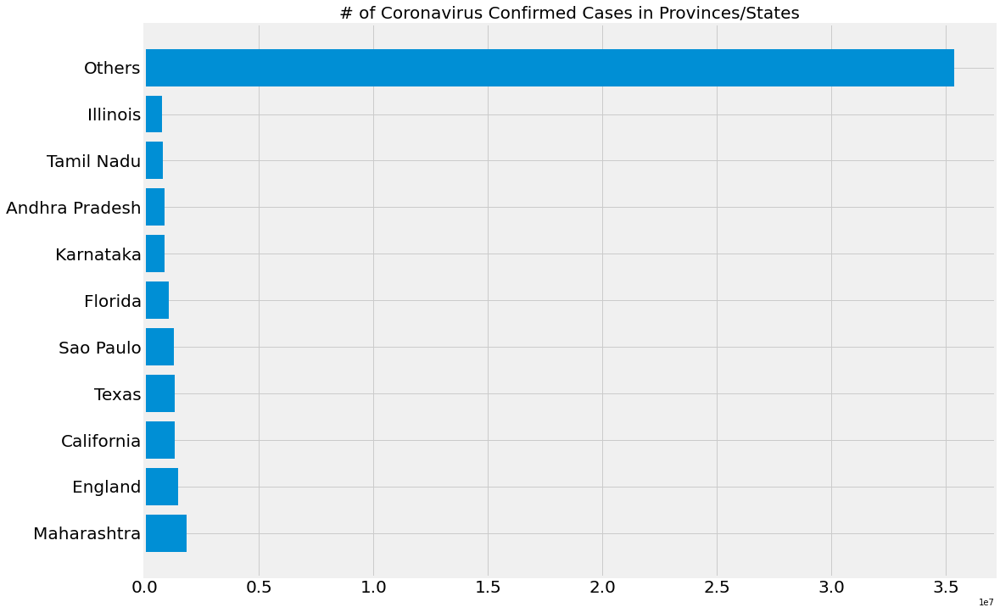

In [74]:
plot_bar_graphs(visual_unique_provinces, visual_confirmed_cases2, '# of Coronavirus Confirmed Cases in Provinces/States')

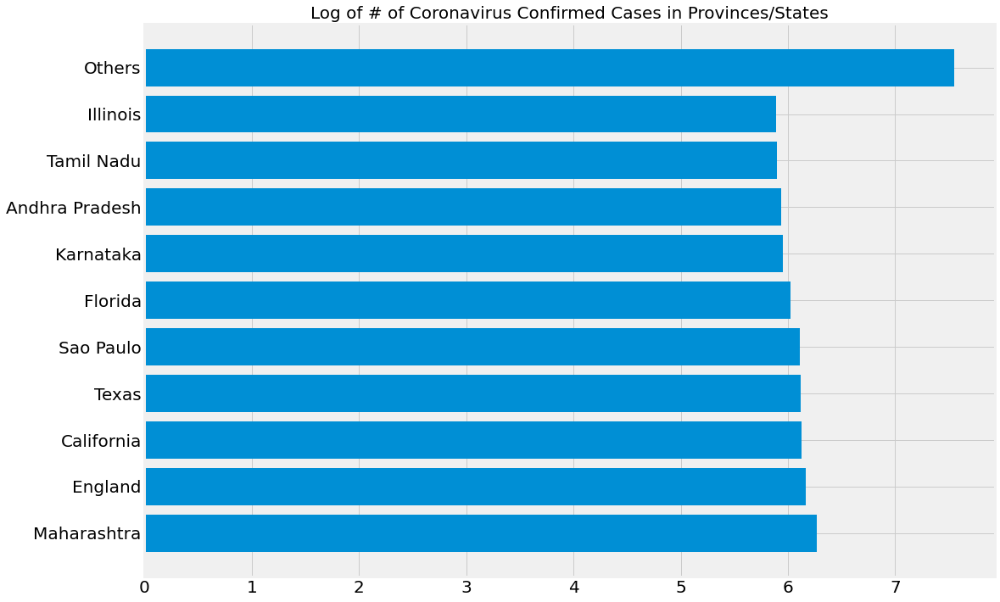

In [75]:
log_province_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases2]
plot_bar_graphs(visual_unique_provinces, log_province_confirmed_cases, 'Log of # of Coronavirus Confirmed Cases in Provinces/States')

<a id='pie_charts'></a>
# Pie Chart Visualizations for COVID-19

In [76]:
def plot_pie_charts(x, y, title):
    # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(20,15))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True, labels=y)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()

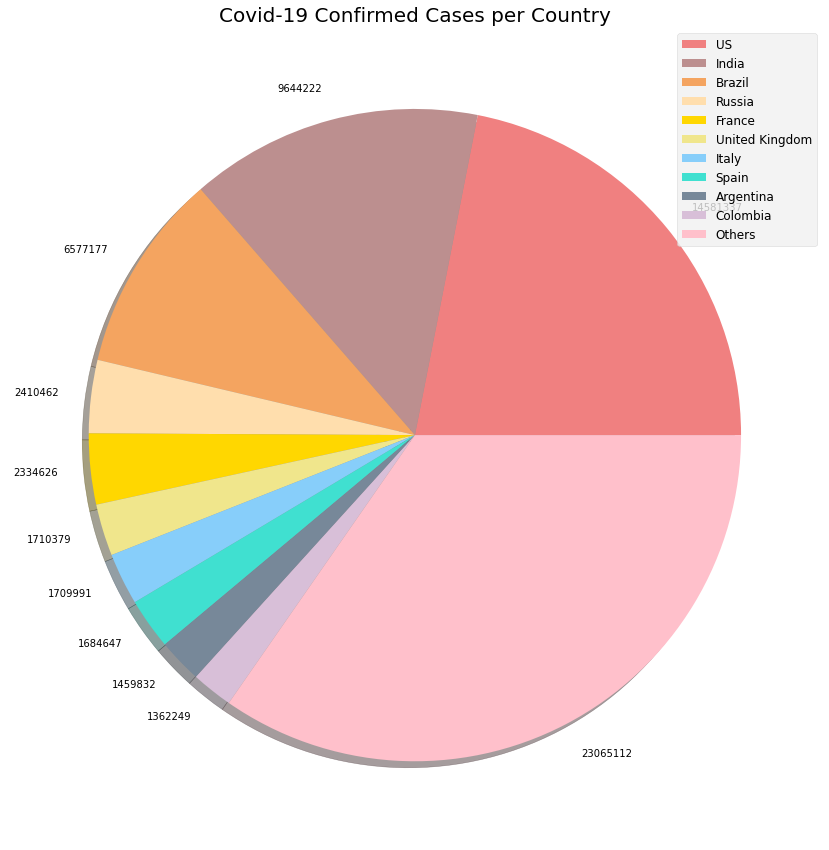

In [77]:
plot_pie_charts(visual_unique_countries, visual_confirmed_cases, 'Covid-19 Confirmed Cases per Country')

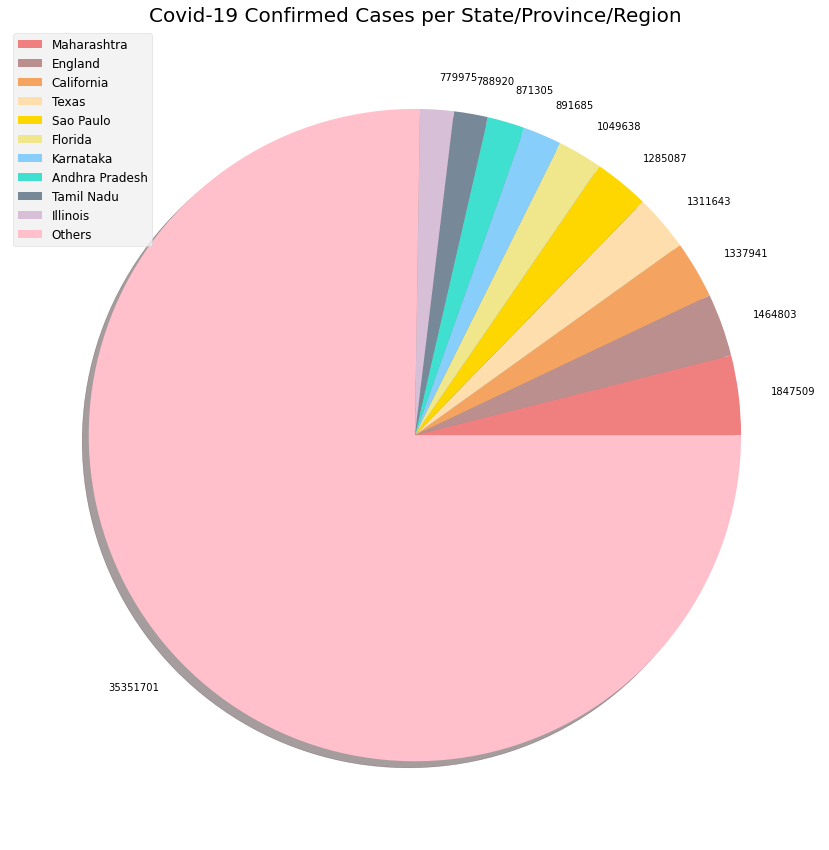

In [78]:
plot_pie_charts(visual_unique_provinces, visual_confirmed_cases2, 'Covid-19 Confirmed Cases per State/Province/Region')

In [79]:
# Plotting countries with regional data using a pie chart 

def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    confirmed_cases = []
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        regions.remove(i)

    # only show the top 5 states
    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]

    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']==regions[i]]['Confirmed'].sum()  
    
    # additional province/state will be considered "others"
    
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_charts(regions_5,confirmed_cases_5, title)
    else:
        plot_pie_charts(regions,confirmed_cases, title)

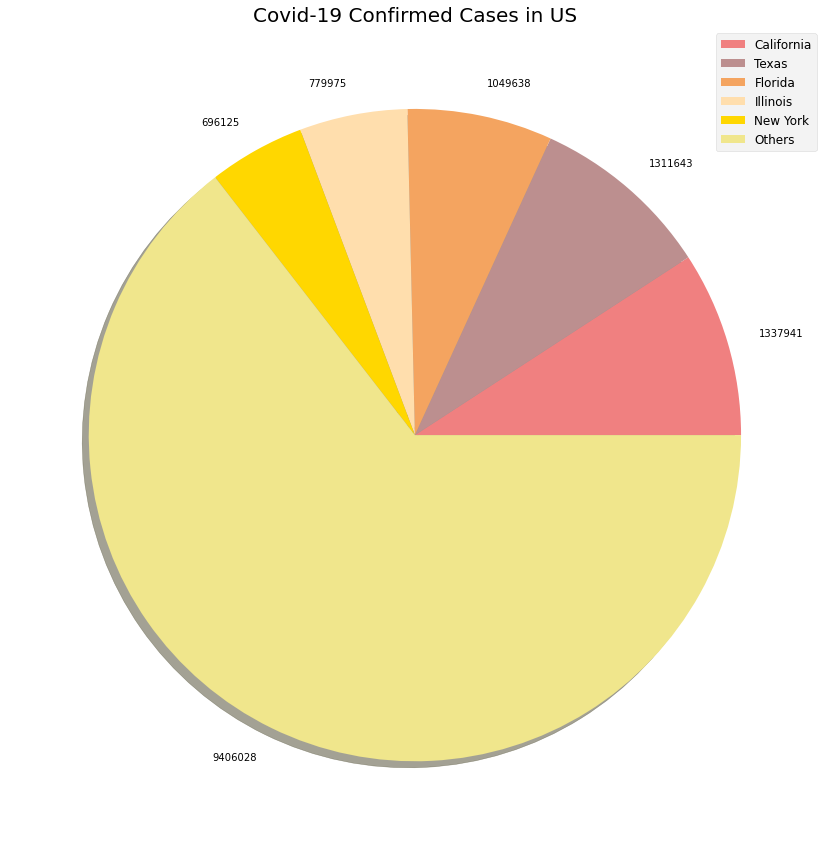

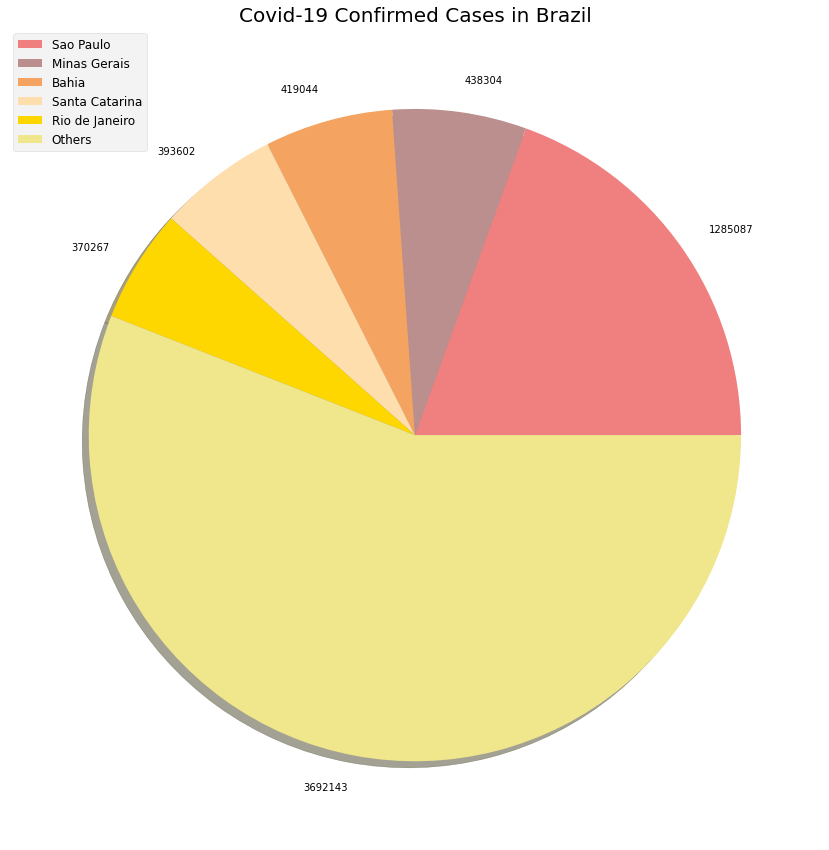

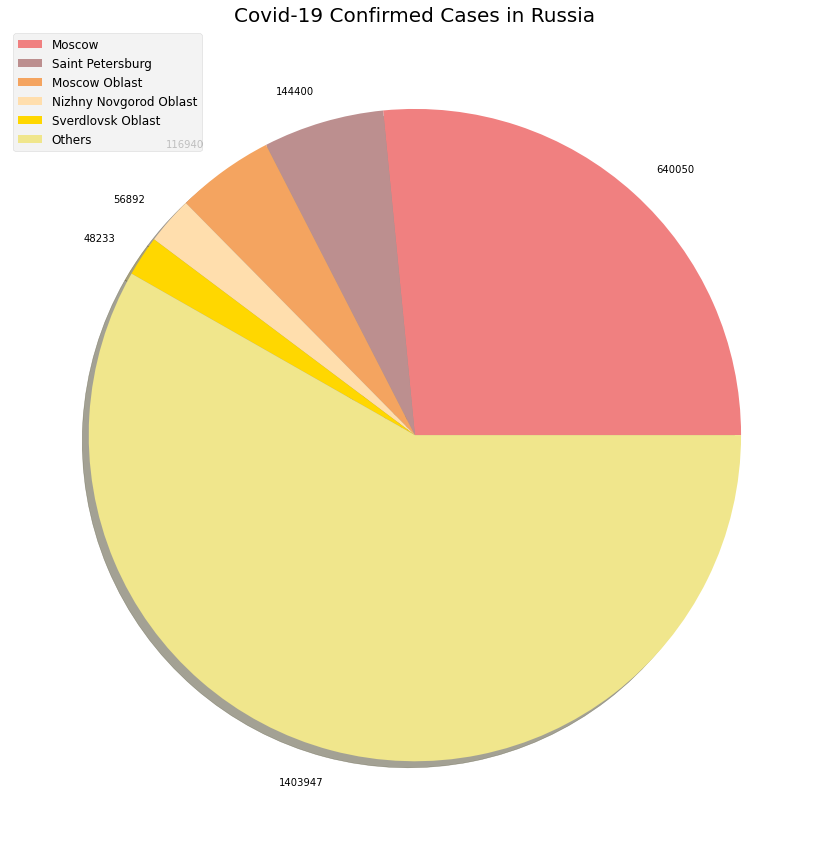

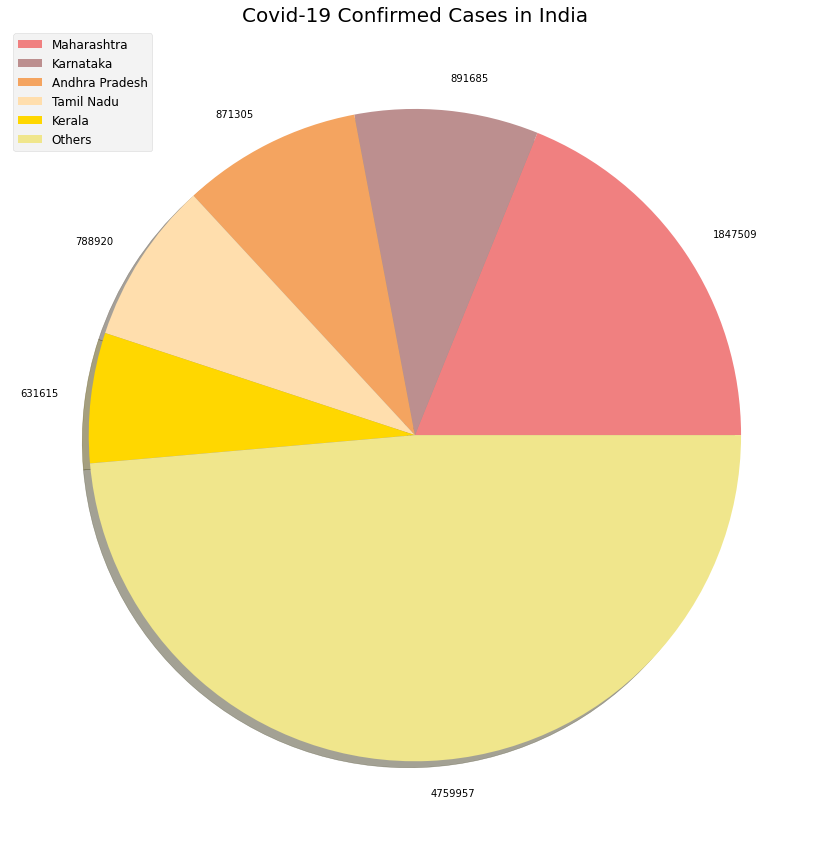

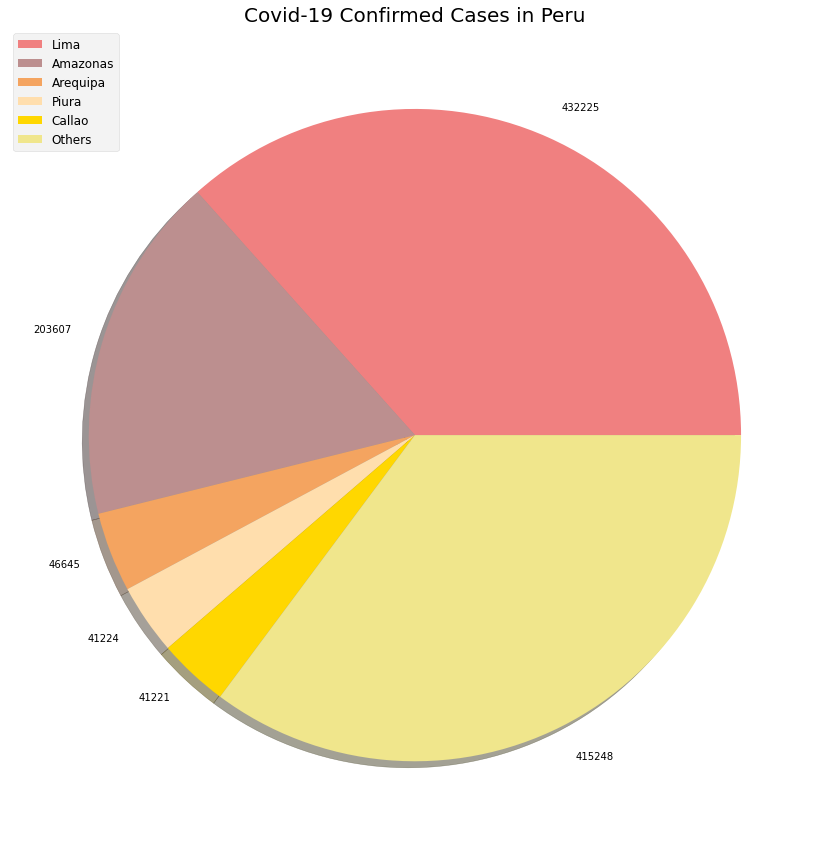

...

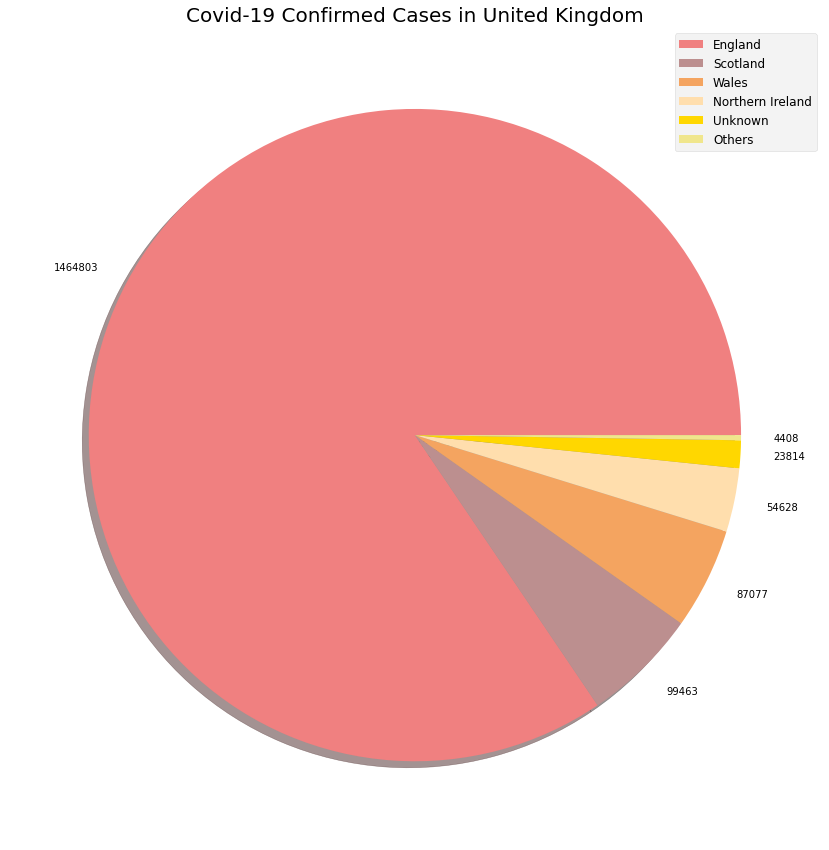

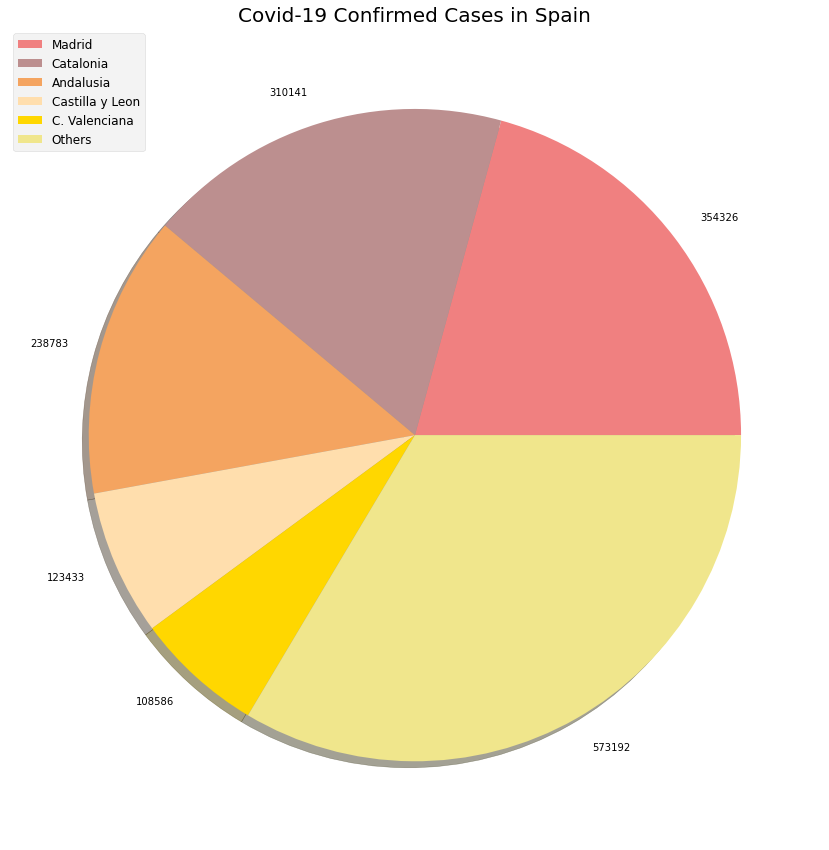

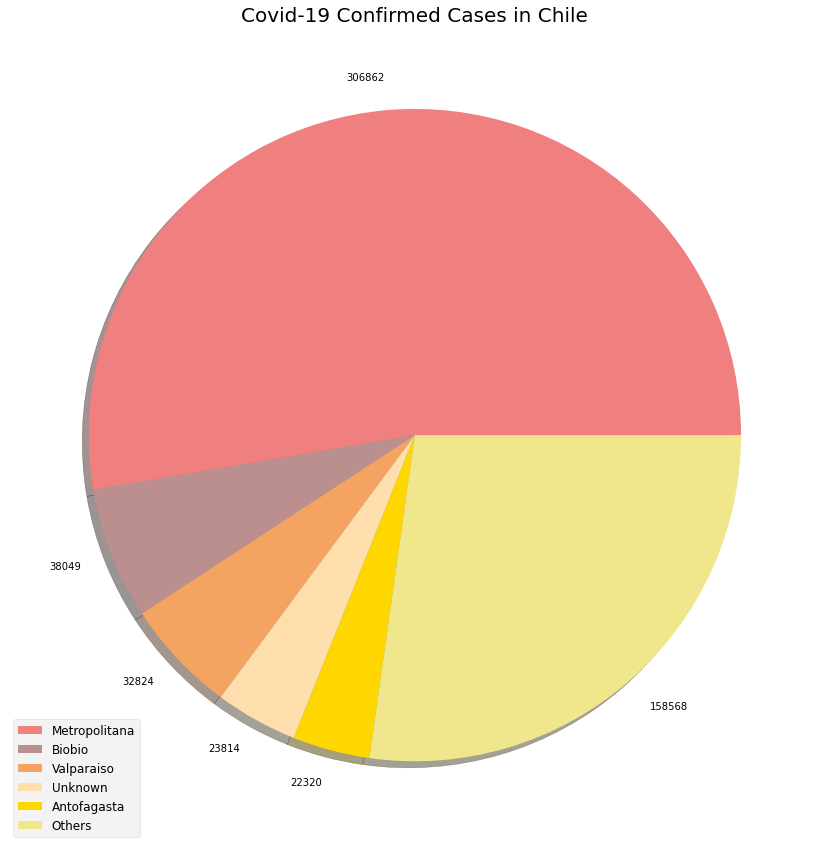

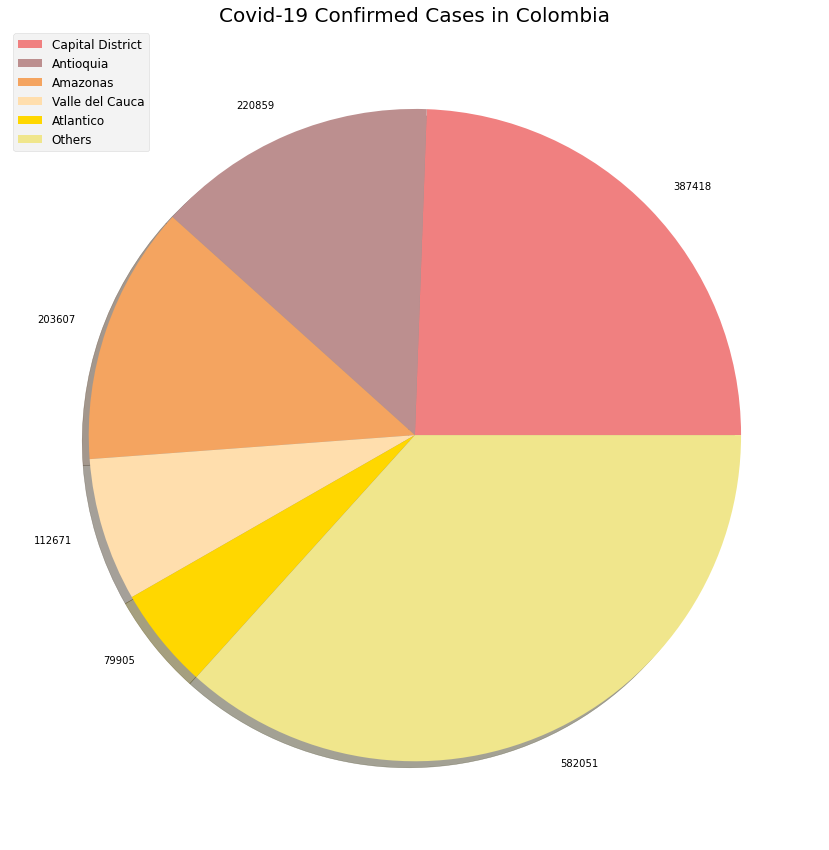

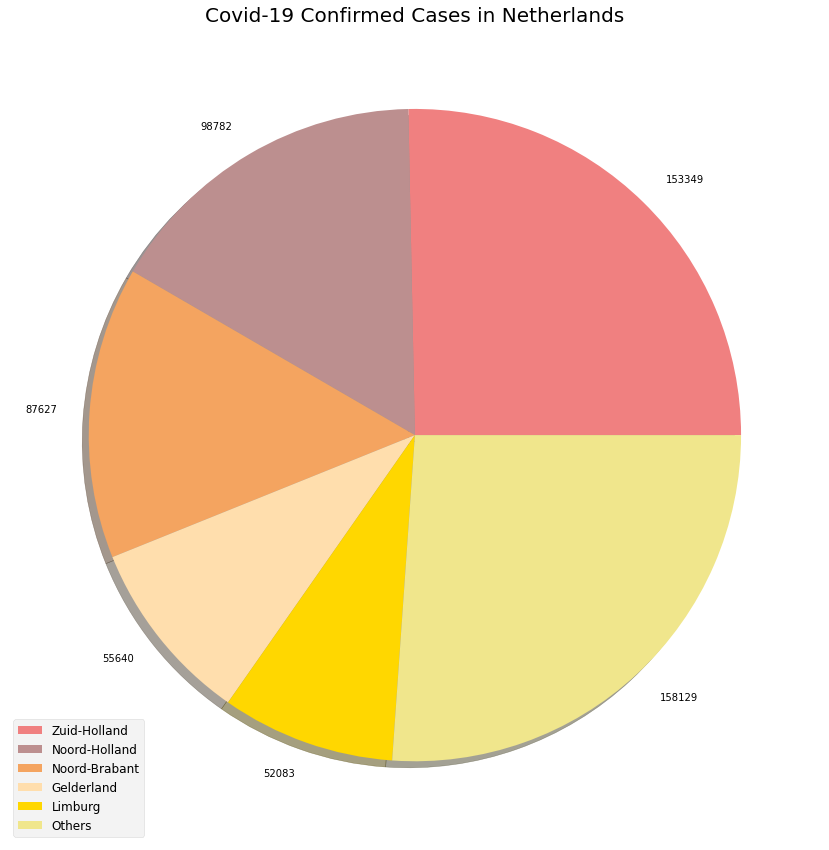

In [80]:
pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'Peru', 'Mexico', 'Canada', 
                       'Australia', 'China', 'Italy', 'Germany', 'France', 'United Kingdom', 'Spain', 'Chile', 'Colombia', 'Netherlands']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i, 'Covid-19 Confirmed Cases in {}'.format(i))

<a id='hospital_testing'></a>
# US Medical Data on Testing 

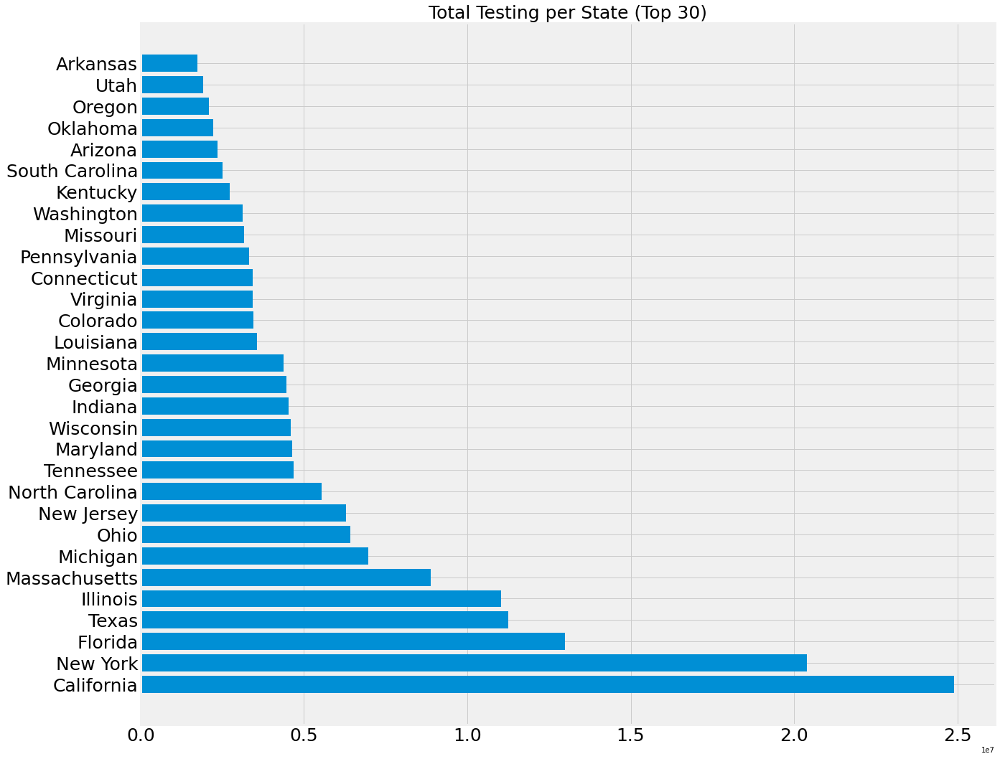

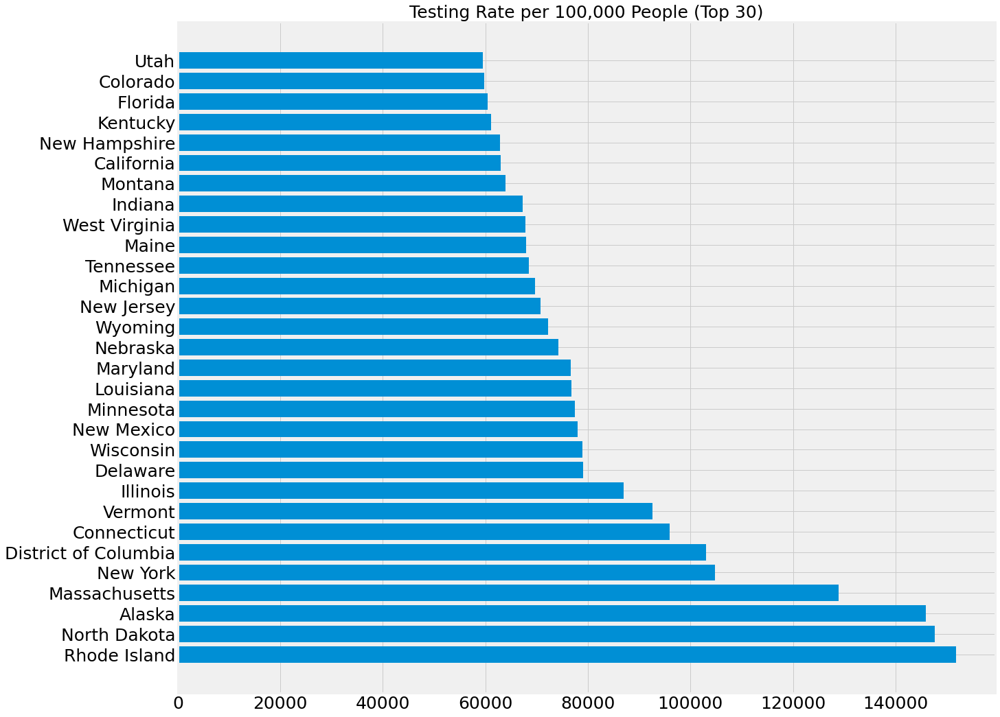

In [81]:
# Replace nan with 0
us_medical_data.fillna(value=0, inplace=True)

def plot_us_medical_data():
    states = us_medical_data['Province_State'].unique()
    testing_number = []
    testing_rate = []
    
    for i in states:
        testing_number.append(us_medical_data[us_medical_data['Province_State']==i]['Total_Test_Results'].sum())
        testing_rate.append(us_medical_data[us_medical_data['Province_State']==i]['Testing_Rate'].max())
    
    # only show the top 15 states
    testing_states = [k for k, v in sorted(zip(states, testing_number), key=operator.itemgetter(1), reverse=True)]
    testing_rate_states = [k for k, v in sorted(zip(states, testing_rate), key=operator.itemgetter(1), reverse=True)]
  
    for i in range(len(states)):
        testing_number[i] = us_medical_data[us_medical_data['Province_State']==testing_states[i]]['Total_Test_Results'].sum()
        testing_rate[i] = us_medical_data[us_medical_data['Province_State']==testing_rate_states[i]]['Testing_Rate'].sum()
    
    top_limit = 30 
    
    plot_bar_graphs_tall(testing_states[:top_limit], testing_number[:top_limit], 'Total Testing per State (Top 30)')
    plot_bar_graphs_tall(testing_rate_states[:top_limit], testing_rate[:top_limit], 'Testing Rate per 100,000 People (Top 30)')

plot_us_medical_data()

<a id='mobility_data'></a>
# Taking a look at Apple's mobility data. It can help us understand hotspot states in the US (states and territories). 

In [82]:
def get_mobility_by_state(transport_type, state, day):
    return apple_mobility[apple_mobility['sub-region']==state][apple_mobility['transportation_type']==transport_type].sum()[day]

In [83]:
apple_mobility.head()

,geo_type,region,transportation_type,alternative_name,sub-region,country,2020-01-13,2020-01-14,2020-01-15,2020-01-16,...,2020-11-24,2020-11-25,2020-11-26,2020-11-27,2020-11-28,2020-11-29,2020-11-30,2020-12-01,2020-12-02,2020-12-03
0,country/region,Albania,driving,NaN,NaN,NaN,100.0,95.30,101.43,97.20,...,97.01,94.64,91.62,108.34,124.73,120.86,105.74,97.80,94.97,96.89
1,country/region,Albania,walking,NaN,NaN,NaN,100.0,100.68,98.93,98.46,...,119.49,122.56,118.68,134.67,135.69,118.89,126.35,123.88,126.48,106.48
2,country/region,Argentina,driving,NaN,NaN,NaN,100.0,97.07,102.45,111.21,...,60.29,63.91,72.30,91.13,87.69,55.07,65.72,70.89,72.47,84.38
3,country/region,Argentina,walking,NaN,NaN,NaN,100.0,95.11,101.37,112.67,...,49.73,53.32,59.24,71.76,60.96,37.25,54.21,61.57,58.88,68.62
4,country/region,Australia,driving,AU,NaN,NaN,100.0,102.98,104.21,108.63,...,103.98,107.94,117.86,114.10,92.44,98.94,100.90,105.52,108.80,120.13


In [84]:
# sample testing 
get_mobility_by_state('walking', 'Connecticut', '2020-07-30')

1104.74

In [85]:
# revising date to fit with the mobility format 
revised_dates = []
for i in range(len(dates)):
    revised_dates.append(datetime.datetime.strptime(dates[i], '%m/%d/%y').strftime('%Y-%m-%d'))

In [86]:
# returns true if it is a weekend, and false if it is a weekday 
def weekday_or_weekend(date):
    date_obj = datetime.datetime.strptime(date, '%Y-%m-%d')
    day_of_the_week =  date_obj.weekday()
    if (day_of_the_week+1) % 6 == 0 or (day_of_the_week+1) % 7 == 0:
        return True 
    else:
        return False 

In [87]:
revised_day_since_1_22 = [i for i in range(len(revised_dates))]

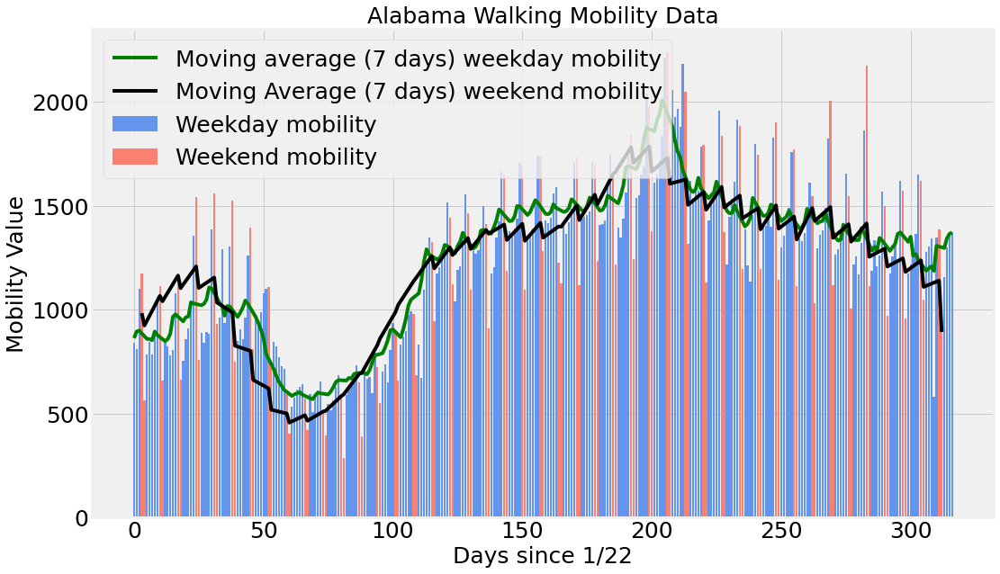

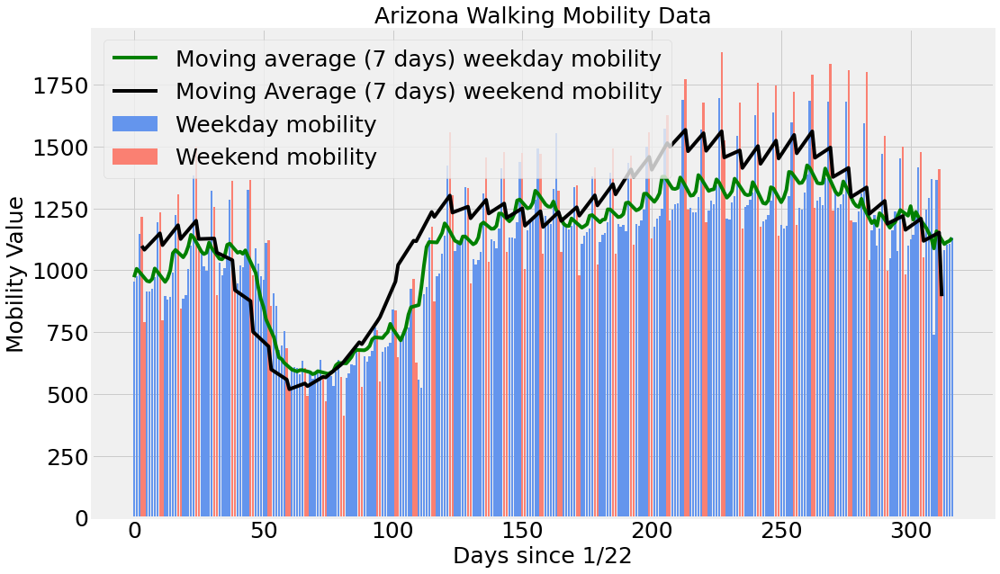

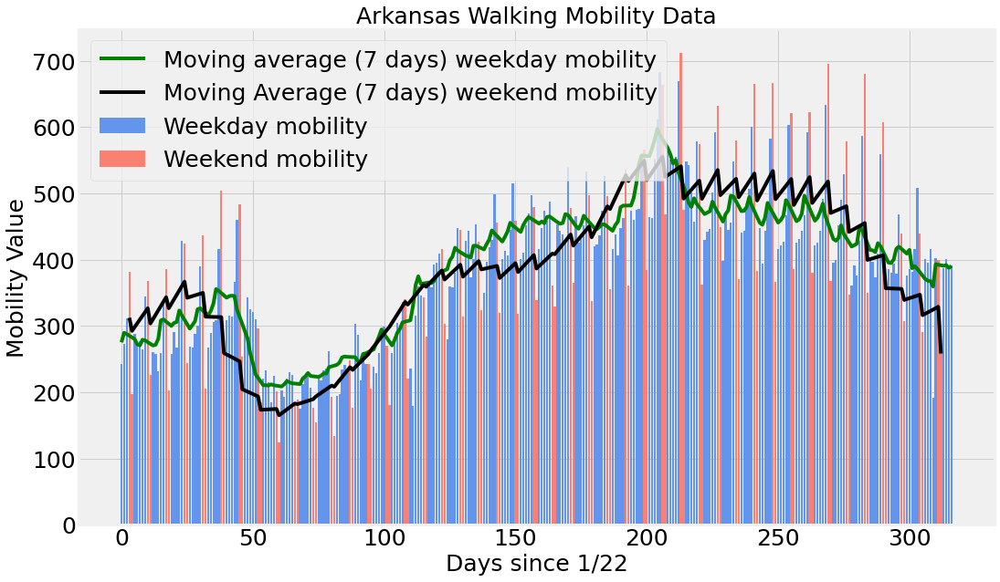

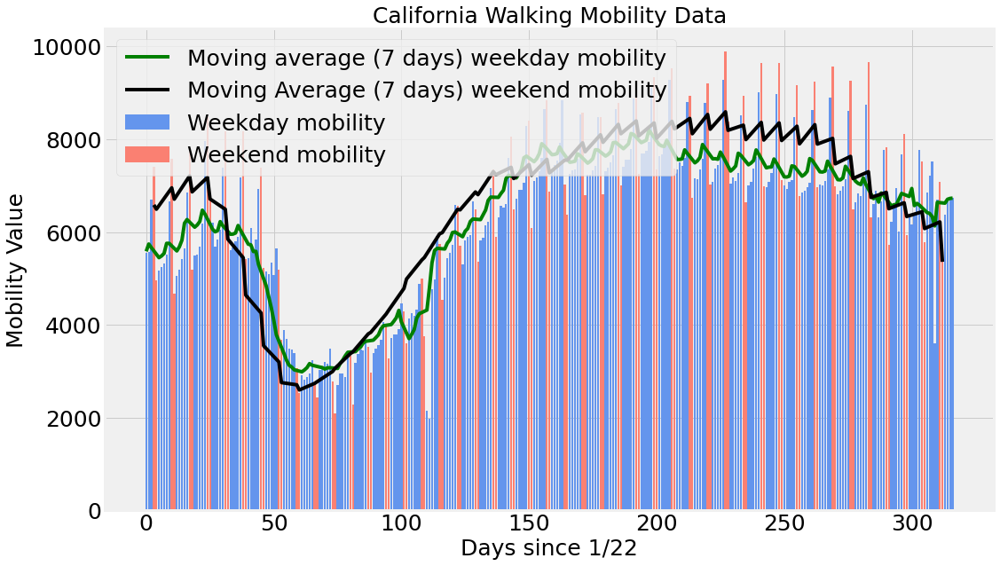

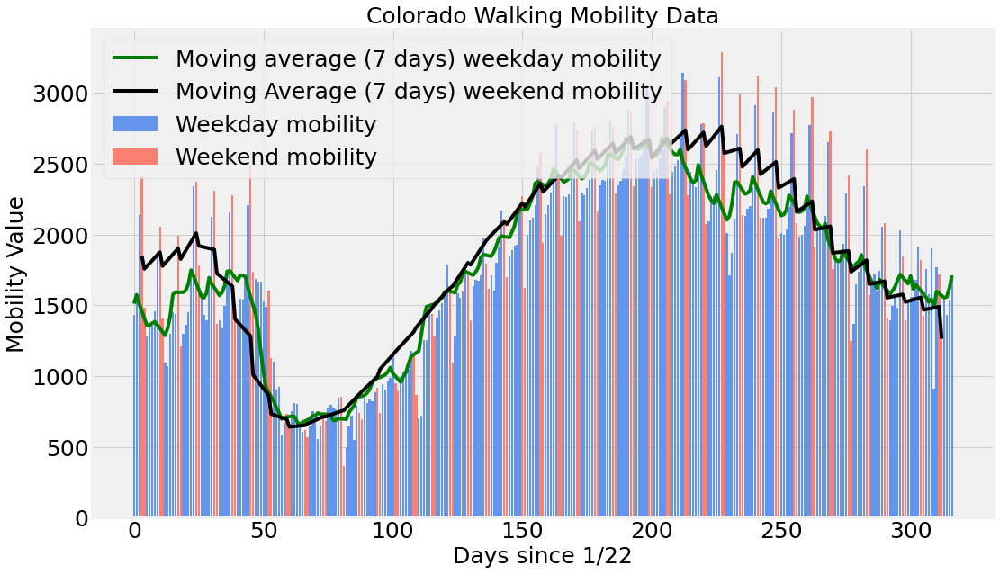

...

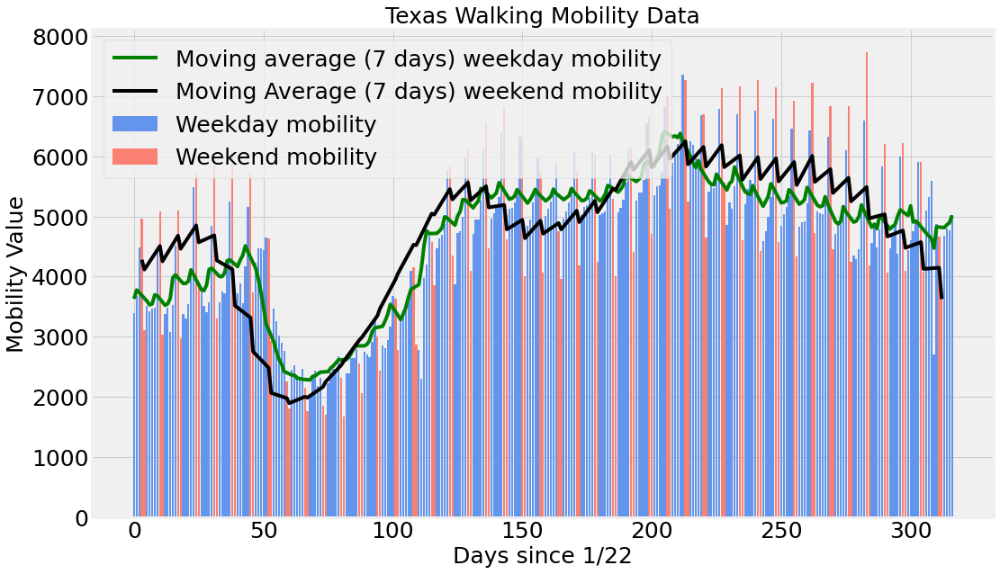

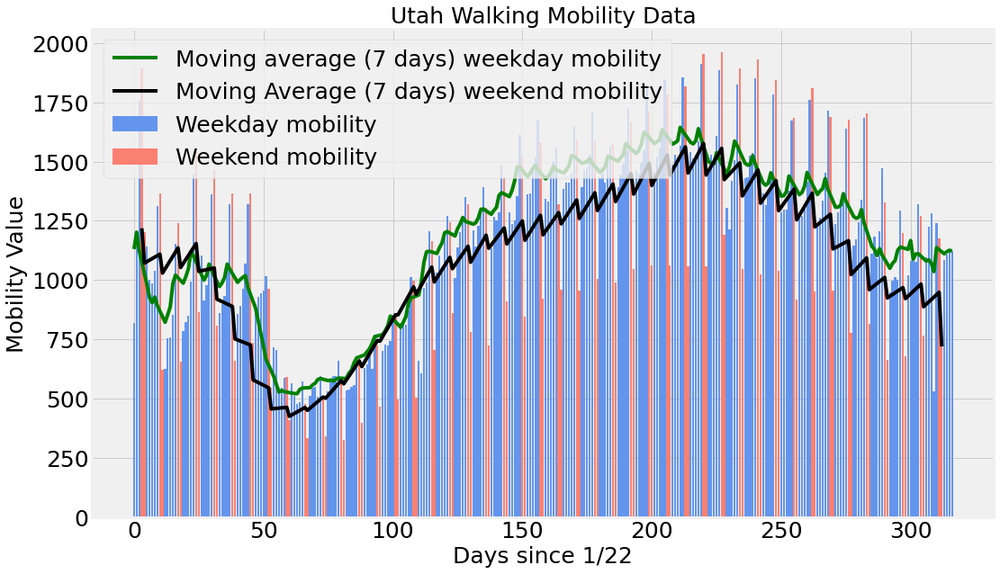

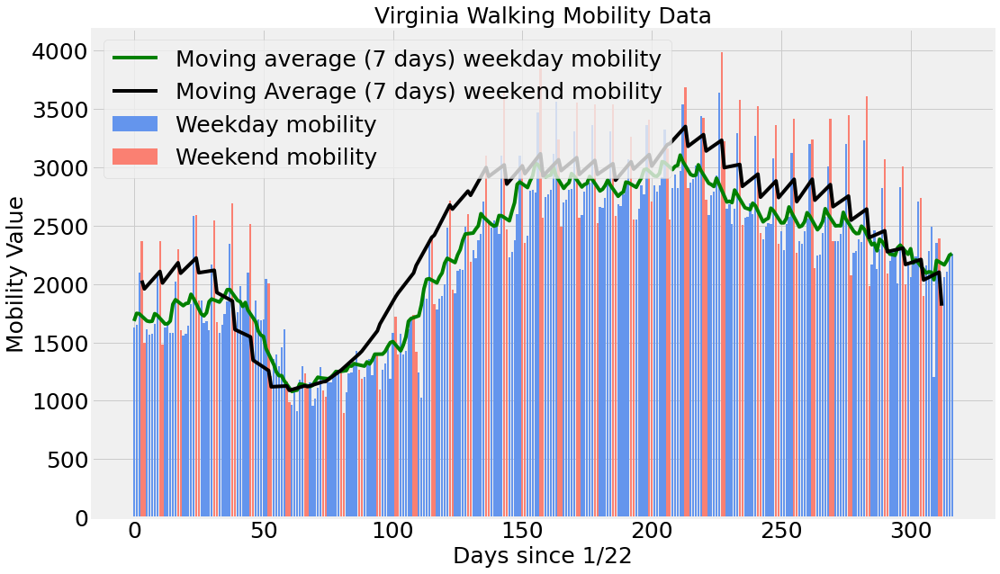

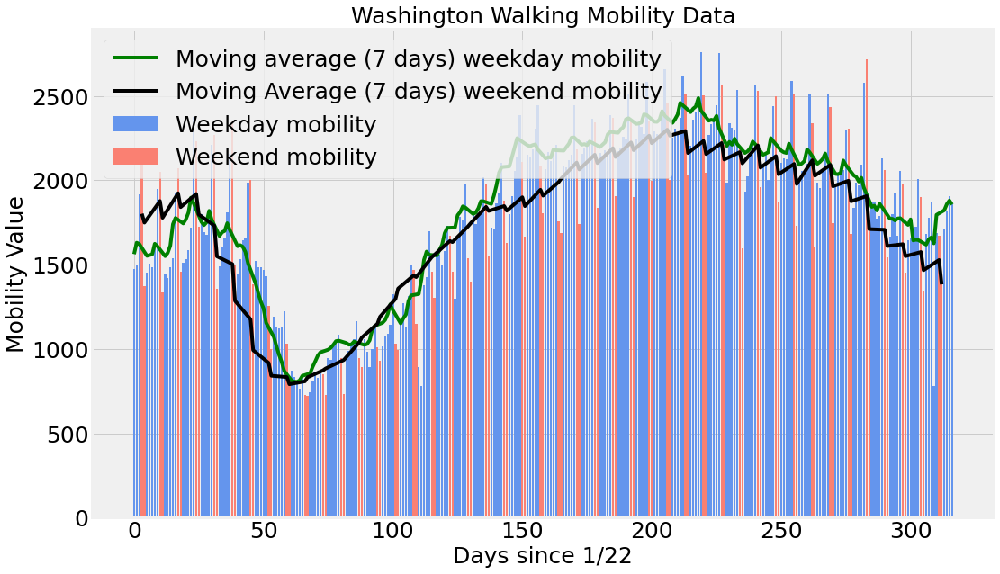

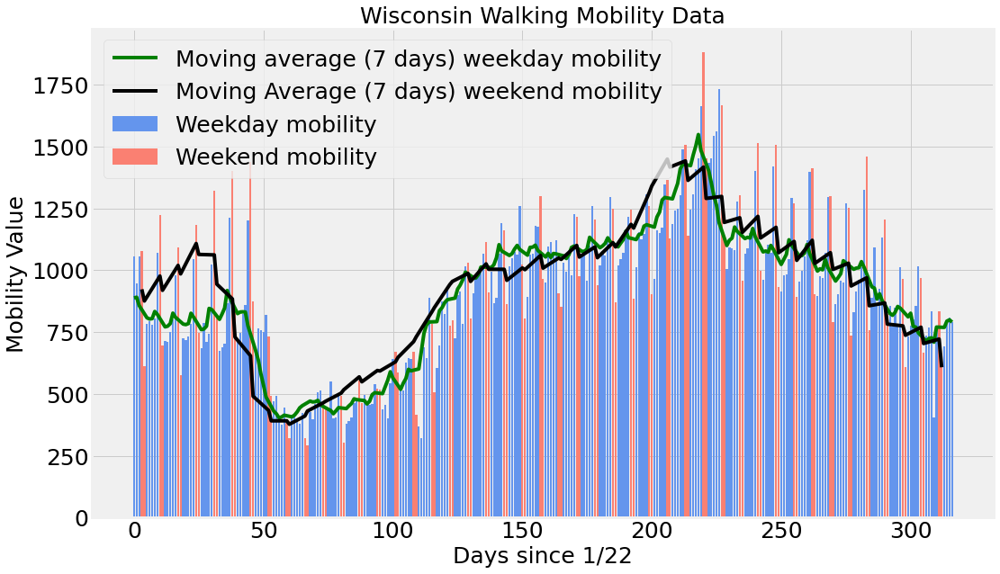

In [88]:
import matplotlib.dates as mdates
states = ['New York', 'Connecticut', 'Florida', 'California', 'Texas', 'Georgia', 'Arizona', 'Illinois', 'Louisiana', 'Ohio',
          'Tennessee', 'North Carolina', 'South Carolina', 'Alabama', 'Missouri', 'Kansas', 'Pennsylvania', 'Wisconsin', 'Virginia', 'Massachusetts', 'Utah', 'Minnesota',
         'Oklahoma', 'Iowa', 'Arkansas', 'Kentucky', 'Puerto Rico', 'Colorado', 'Idaho', 'New Jersey', 'Nevada', 'Maryland', 'Indiana', 'Washington', 'Montana', 'Rhode Island',
         'New Mexico']
states.sort()

# making sure the dates are in sync 
mobility_latest_date = apple_mobility.columns[-1]
mobility_latest_index = revised_dates.index(mobility_latest_date)

for state in states:
    # weekend and weekday mobility are separated 
    weekday_mobility = []
    weekday_mobility_dates = [] 
    weekend_mobility = [] 
    weekend_mobility_dates = [] 
    
    for i in range(len(revised_dates)):
        if i <= mobility_latest_index:
            if weekday_or_weekend(revised_dates[i]):
                weekend_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
                weekend_mobility_dates.append(i)
            else:
                weekday_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
                weekday_mobility_dates.append(i)
        else:
            pass
        
    # remove null values (they are counted as 0)
    for i in range(len(weekend_mobility)):       
        if weekend_mobility[i] == 0 and i != 0:
            weekend_mobility[i] = weekend_mobility[i-1]
        elif weekend_mobility[i] == 0 and i == 0:
            weekend_mobility[i] = weekend_mobility[i+1]
        else:
            pass
        
    for i in range(len(weekday_mobility)):       
        if weekday_mobility[i] == 0 and i != 0:
            weekday_mobility[i] = weekday_mobility[i-1]
        elif weekday_mobility[i] == 0 and i == 0:
            weekday_mobility[i] = weekday_mobility[i+1]
        else:
            pass
    
    
    weekday_mobility_average = moving_average(weekday_mobility, 7)
    weekend_mobility_average = moving_average(weekend_mobility, 7)
    
    plt.figure(figsize=(16, 10))
    plt.bar(weekday_mobility_dates, weekday_mobility, color='cornflowerblue')
    plt.plot(weekday_mobility_dates, weekday_mobility_average, color='green')
    
    plt.bar(weekend_mobility_dates, weekend_mobility, color='salmon')
    plt.plot(weekend_mobility_dates, weekend_mobility_average, color='black')
    
    plt.legend(['Moving average (7 days) weekday mobility', 'Moving Average (7 days) weekend mobility', 'Weekday mobility', 'Weekend mobility'], prop={'size': 25})
    plt.title('{} Walking Mobility Data'.format(state), size=25)
    plt.xlabel('Days since 1/22', size=25)
    plt.ylabel('Mobility Value', size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()

<a id='gviz'></a>
# Geographical visualization


In [90]:
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
pyo.init_notebook_mode()

In [91]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,45723,45844,46116,46274,46516,46718,46837,46837,47072,47306
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,36245,36790,37625,38182,39014,39719,40501,41302,42148,42988
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,80168,81212,82221,83199,84152,85084,85927,86730,87502,88252
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,6610,6610,6712,6745,6790,6842,6904,6955,7005,7050
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,15008,15087,15103,15139,15251,15319,15361,15493,15536,15591


In [92]:
df_countries = confirmed_df.iloc[:,[1,-1]]
df_countries.rename(columns={'Country/Region':'Country', '12/6/20' : 'Confirmed'}, inplace = True)
df_countries.head()

,Country,Confirmed
0,Afghanistan,47306
1,Albania,42988
2,Algeria,88252
3,Andorra,7050
4,Angola,15591


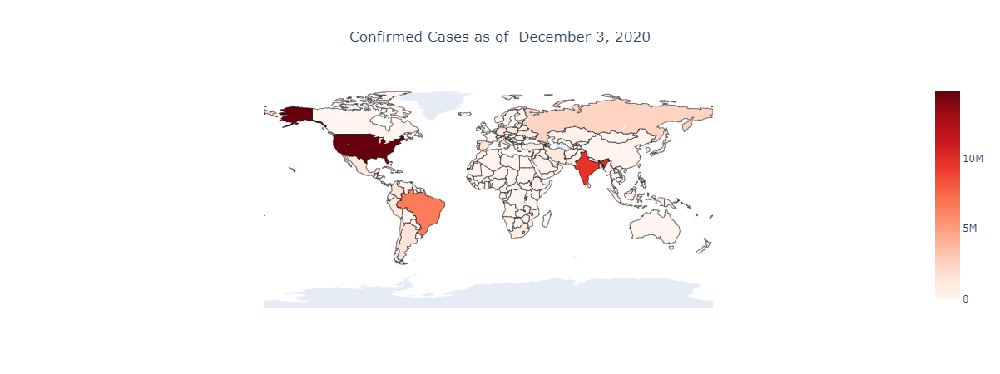

In [93]:
# Manipulate Dataframe
df_countries = df_countries.drop_duplicates(subset = ['Country'])
df_countries = df_countries[df_countries['Confirmed']>0]
# Create the Choropleth
fig = go.Figure(data=go.Choropleth(
    locations = df_countries['Country'],
    locationmode = 'country names',
    z = df_countries['Confirmed'],
    colorscale = 'reds',
    marker_line_color = 'black',
    marker_line_width = 0.5,
))
fig.update_layout(
    title_text = 'Confirmed Cases as of  December 3, 2020',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
        projection_type = 'equirectangular'
    )
)
